In [1]:
import numpy as np
import xarray as xr

import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.colors import LogNorm
%matplotlib inline


import os
import shutil
import glob
# import xrft

from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

from matplotlib.tri import Triangulation
from mpas_tools.viz import mesh_to_triangles
from mpas_tools.ocean import depth
from mpas_tools.viz import colormaps

In [2]:
ytdir = {}
mmdir = {}

grid = {}


ytdir['bgc0-bkmix1'] = '/global/cscratch1/sd/ytakano/chrys/GMPAS-JRA1p4_EC30to60E2r2_chrysalis-bgc0-bkmix1_5-10-5-tranco2/run/'
ytdir['bgc0-tranco2'] = '/global/cscratch1/sd/ytakano/chrys/GMPAS-JRA1p4_EC30to60E2r2_chrysalis-bgc0-tranco2/run/'
ytdir['bgc0-redi1200'] = '/global/cscratch1/sd/ytakano/chrys/GMPAS-JRA1p4_EC30to60E2r2_chrysalis-bgc0-redi1200-tranco2/run/'

mmdir['30-10-spinup'] = '/global/cscratch1/sd/maltrud/E3SM_simulations/onHPSS/GMPAS-JRA-OECO_RRS30to10v3_spinup_anvil02/ocn/hist/'
mmdir['30-10-tranco2'] = '/global/cscratch1/sd/maltrud/E3SM_simulations/onHPSS/GMPAS-JRA1p4_RRS30to10v3_OECO_20tr_chrys01/ocn/hist/'



mmdir['30-60-spinup'] = '/global/cscratch1/sd/maltrud/E3SM_simulations/onHPSS/GMPAS-JRA-OECO_EC30to60E2r2_spinup_chrys01/ocn/hist/'
mmdir['30-60-tranco2'] = '/global/cscratch1/sd/maltrud/E3SM_simulations/queueForHPSS/GMPAS-JRA1p4_EC30to60E2r2_OECO_20tr_chrys01/ocn/hist/'


mmdir['30-60-L80_spinup'] = '/global/cscratch1/sd/maltrud/E3SM_simulations/onHPSS/GMPAS-JRA-OECO_EC30to60E2r2L80_spinup_chrys01/ocn/hist/'
mmdir['30-60-L80_tranco2'] = '/global/cscratch1/sd/maltrud/E3SM_simulations/queueForHPSS/GMPAS-JRA1p4_EC30to60E2r2L80_OECO_20tr_chrys01/ocn/hist/'

grid['30-10'] = xr.open_dataset('/global/cfs/cdirs/e3sm/inputdata/ocn/mpas-o/oRRS30to10v3/oRRS30to10v3.171128.nc')
grid['30-60'] = xr.open_dataset('/global/cfs/cdirs/e3sm/inputdata/ocn/mpas-o/EC30to60E2r2/ocean.EC30to60E2r2.210210.nc')
grid['30-60-L80'] = xr.open_dataset('/global/cscratch1/sd/anirbans/GMPAS-JRA-RYF8485_EC30to60E2r2L80_chrys01.mpaso.rst.0003-01-01_00000.nc')



In [3]:
fname_prefixes = ['GMPAS-JRA1p4_EC30to60E2r2_chrysalis-bgc0-bkmix1_5-10-5-tranco2',
                  'GMPAS-JRA1p4_EC30to60E2r2_chrysalis-bgc0-tranco2',
                  'GMPAS-JRA1p4_EC30to60E2r2_chrysalis-bgc0-redi1200-tranco2',
                  'GMPAS-JRA1p4_EC30to60E2r2_OECO_20tr_chrys01',
                  'GMPAS-JRA1p4_EC30to60E2r2L80_OECO_20tr_chrys01',
                  'GMPAS-JRA1p4_RRS30to10v3_OECO_20tr_chrys01',
                 ]

run_dirs = [ytdir['bgc0-bkmix1'],
            ytdir['bgc0-tranco2'],
            ytdir['bgc0-redi1200'],
            mmdir['30-60-tranco2'],
            mmdir['30-60-L80_tranco2'],
            mmdir['30-10-tranco2'],
           ]

fname_suffix = '.mpaso.hist.am.timeSeriesStatsMonthly.*'

labels = ['bgc0-bkmix1-tranco2', 
          'bgc0-tranco2',
          'bgc0-redi1200-tranco2',
          '30-60-tranco2',
          '30-60-L80_tranco2',
          '30-10-tranco2',
         ]

flist = {}
for lab, fname, rd in zip(labels, fname_prefixes, run_dirs):
    flist[lab] = sorted(glob.glob(rd +  '/'+ fname+ fname_suffix))



In [4]:
grids = {}
for lab in labels[:4]:
    grids[lab] = grid['30-60']
grids[labels[4]] = grid['30-60-L80']
grids[labels[5]] = grid['30-10']

In [5]:
times = {}
for lab in labels:
    # times[lab] = pd.date_range('1958', periods = len(flist[lab]), freq='MS')
    times[lab] = pd.date_range('1958', periods = 721, freq='MS')

In [6]:
def rough_zmid(grid):
    zbot = grid.refBottomDepth.values
    ztop = np.zeros(len(zbot)+1)
    ztop[1:] = zbot
    zmid = -0.5*(ztop[:-1]+zbot)
    return zmid, ztop[:-1]



In [7]:
zmid = {}

ztop = {}

for lab in labels:
    zmid[lab], ztop[lab] = rough_zmid(grids[lab])

In [27]:
# mpas_data_dir = '/global/cscratch1/sd/anirbans/MPAS_output_singlevars/'

# maps = {}
# maps['EC30to60E2r2_to1deg']= xr.open_dataset(mpas_data_dir+'map_EC30to60E2r2_to_1.0x1.0degree_bilinear.nc')

# maps['oRRS30to10_to0.5deg']= xr.open_dataset(mpas_data_dir+'map_oRRS30to10_TO_0.5x0.5degree_blin.160412.nc')

# maps['oRRS30to10v3wLI_to0.5deg']= xr.open_dataset(mpas_data_dir+'map_oRRS30to10v3wLI_to_0.5x0.5degree_bilinear.nc')



In [26]:
zmid['30-60-L80_tranco2'].shape

(80,)

In [25]:
zmid['30-10-tranco2'].shape

(80,)

In [28]:
labels[:-1]

['bgc0-bkmix1-tranco2',
 'bgc0-tranco2',
 'bgc0-redi1200-tranco2',
 '30-60-tranco2',
 '30-60-L80_tranco2']

In [8]:
%%time

mpas_data_dir = '/global/cscratch1/sd/anirbans/MPAS_output_singlevars/'
ds_r = {}
for lab in labels[:-1]:
    pDensity = xr.open_mfdataset(mpas_data_dir+lab+'/remapped/potentialDensity_1deg_*', concat_dim='Time', combine='nested')
    temperature = xr.open_mfdataset(mpas_data_dir+lab+'/remapped/temperature_1deg_*', concat_dim='Time', combine='nested')
    DIC = xr.open_mfdataset(mpas_data_dir+lab+'/remapped/DIC_1deg_*', concat_dim='Time', combine='nested')
    N2 = xr.open_mfdataset(mpas_data_dir+lab+'/remapped/BruntVaisalaFreqTop_1deg_*', concat_dim='Time', combine='nested')
    CO2flux = xr.open_mfdataset(mpas_data_dir+lab+'/remapped/CO2gasflux_1deg_*', concat_dim='Time', combine='nested')
    blD = xr.open_mfdataset(mpas_data_dir+lab+'/remapped/boundaryLayerDepth_1deg_*', concat_dim='Time', combine='nested')
    print('Finished reading ', lab)
    ds_r[lab] = xr.merge([pDensity, temperature, DIC, N2, CO2flux, blD])
    print('Finished merging ', lab)
    
    

Finished reading  bgc0-bkmix1-tranco2
Finished merging  bgc0-bkmix1-tranco2
Finished reading  bgc0-tranco2
Finished merging  bgc0-tranco2
Finished reading  bgc0-redi1200-tranco2
Finished merging  bgc0-redi1200-tranco2
Finished reading  30-60-tranco2
Finished merging  30-60-tranco2
Finished reading  30-60-L80_tranco2
Finished merging  30-60-L80_tranco2
CPU times: user 21min 50s, sys: 7min 32s, total: 29min 22s
Wall time: 52min 53s


In [13]:
ds_r[lab]

<xarray.Dataset>
Dimensions:              (lat: 180, lon: 360, Time: 721, nbnd: 2,
                          nVertLevels: 80)
Coordinates:
  * lat                  (lat) float64 -89.5 -88.5 -87.5 ... 87.5 88.5 89.5
  * lon                  (lon) float64 -179.5 -178.5 -177.5 ... 178.5 179.5
Dimensions without coordinates: Time, nbnd, nVertLevels
Data variables:
    lat_bnds             (Time, lat, nbnd) float64 dask.array<chunksize=(1, 180, 2), meta=np.ndarray>
    lon_bnds             (Time, lon, nbnd) float64 dask.array<chunksize=(1, 360, 2), meta=np.ndarray>
    gw                   (Time, lat) float64 dask.array<chunksize=(1, 180), meta=np.ndarray>
    area                 (Time, lat, lon) float64 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    potentialDensity     (Time, nVertLevels, lat, lon) float32 dask.array<chunksize=(1, 80, 180, 360), meta=np.ndarray>
    temperature          (Time, nVertLevels, lat, lon) float32 dask.array<chunksize=(1, 80, 180, 360), meta=np.ndarray>
    DIC                  (Time, nVertLevels, lat, lon) float32 dask.array<chunksize=(1, 80, 180, 360), meta=np.ndarray>
    BruntVaisalaFreqTop  (Time, nVertLevels, lat, lon) float32 dask.array<chunksize=(1, 80, 180, 360), meta=np.ndarray>
    CO2gasflux           (Time, lat, lon) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    boundaryLayerDepth   (Time, lat, lon) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
Attributes:
    remap_script:              ncremap
    remap_hostname:            cori09
    remap_version:             5.0.6
    NCO:                       netCDF Operators version 5.0.6 (Homepage = htt...
    history:                   Tue Apr 12 00:25:28 2022: ncks -O -t 2 --no_tm...
    nco_openmp_thread_number:  2
    title:                     Regridded version of ncremap_tmp_att.nc.pid125...
    map_file:                  ./map_EC30to60E2r2_to_1.0x1.0degree_bilinear.nc
    input_file:                ./ncremap_tmp_att.nc.pid12524.flidx0

In [9]:
%%time

for lab in labels[:-1]:

    ds_r[lab].coords['time'] = ('Time', times[lab])
    ds_r[lab].coords['Z'] = ('nVertLevels', zmid[lab])
    ds_r[lab] = ds_r[lab].swap_dims({'Time': 'time', 'nVertLevels': 'Z'})
    # ds_r = ds_r.swap_dims({'nVertLevels': 'Z'})
    print(lab)

bgc0-bkmix1-tranco2
bgc0-tranco2
bgc0-redi1200-tranco2
30-60-tranco2
30-60-L80_tranco2
CPU times: user 12.4 ms, sys: 0 ns, total: 12.4 ms
Wall time: 12.1 ms


In [14]:
lab = labels[1]
ds_r[lab]

<xarray.Dataset>
Dimensions:              (lat: 180, lon: 360, time: 721, nbnd: 2, Z: 60)
Coordinates:
  * lat                  (lat) float64 -89.5 -88.5 -87.5 ... 87.5 88.5 89.5
  * lon                  (lon) float64 -179.5 -178.5 -177.5 ... 178.5 179.5
  * time                 (time) datetime64[ns] 1958-01-01 ... 2018-01-01
  * Z                    (Z) float64 -5.0 -15.0 -25.0 ... -5.125e+03 -5.375e+03
Dimensions without coordinates: nbnd
Data variables:
    lat_bnds             (time, lat, nbnd) float64 dask.array<chunksize=(1, 180, 2), meta=np.ndarray>
    lon_bnds             (time, lon, nbnd) float64 dask.array<chunksize=(1, 360, 2), meta=np.ndarray>
    gw                   (time, lat) float64 dask.array<chunksize=(1, 180), meta=np.ndarray>
    area                 (time, lat, lon) float64 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    potentialDensity     (time, Z, lat, lon) float32 dask.array<chunksize=(1, 60, 180, 360), meta=np.ndarray>
    temperature          (time, Z, lat, lon) float32 dask.array<chunksize=(1, 60, 180, 360), meta=np.ndarray>
    DIC                  (time, Z, lat, lon) float32 dask.array<chunksize=(1, 60, 180, 360), meta=np.ndarray>
    BruntVaisalaFreqTop  (time, Z, lat, lon) float32 dask.array<chunksize=(1, 60, 180, 360), meta=np.ndarray>
    CO2gasflux           (time, lat, lon) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    boundaryLayerDepth   (time, lat, lon) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
Attributes:
    remap_script:              ncremap
    remap_hostname:            cori01
    remap_version:             5.0.6
    NCO:                       netCDF Operators version 5.0.6 (Homepage = htt...
    history:                   Tue Apr 12 08:27:46 2022: ncks -O -t 2 --no_tm...
    nco_openmp_thread_number:  2
    title:                     Regridded version of ncremap_tmp_att.nc.pid602...
    map_file:                  ./map_EC30to60E2r2_to_1.0x1.0degree_bilinear.nc
    input_file:                ./ncremap_tmp_att.nc.pid60260.flidx0

In [10]:
isopycnal1 = 1026.6
isopycnal2 = 1027.4
mw_limits = [17, 19]

LonTrans = ['-67', '-55', '-50' ,'-40', '-32']



In [15]:
LonTrans

['-67', '-55', '-50', '-40', '-32']

In [11]:
from matplotlib.tri import Triangulation
from mpas_tools.viz import mesh_to_triangles
from mpas_tools.ocean import depth
from mpas_tools.viz import colormaps
colormaps.register_sci_viz_colormaps()

scvizcmaps = ['3wave-yellow-grey-blue', '3Wbgy5',
                    '4wave-grey-red-green-mgreen', '5wave-yellow-brown-blue',
                    'blue-1', 'blue-3', 'blue-6', 'blue-8', 'blue-orange-div',
                    'brown-2', 'brown-5', 'brown-8', 'green-1', 'green-4',
                    'green-7', 'green-8', 'orange-5', 'orange-6',
                    'orange-green-blue-gray', 'purple-7', 'purple-8', 'red-1',
                    'red-3', 'red-4', 'yellow-1', 'yellow-7']

In [20]:
landmask = {}
for lab in labels[:-1]:
    landmask[lab] = (ds_r[lab].temperature > -20) & (ds_r[lab].potentialDensity > 900) & (ds_r[lab].DIC > 0)

In [12]:
pdmask = {}
for lab in labels[:-1]:
    pdmask[lab] = (ds_r[lab].potentialDensity > 1021)

In [34]:
np.arange(1e-6,4e-4, 5e-6)

array([1.00e-06, 6.00e-06, 1.10e-05, 1.60e-05, 2.10e-05, 2.60e-05,
       3.10e-05, 3.60e-05, 4.10e-05, 4.60e-05, 5.10e-05, 5.60e-05,
       6.10e-05, 6.60e-05, 7.10e-05, 7.60e-05, 8.10e-05, 8.60e-05,
       9.10e-05, 9.60e-05, 1.01e-04, 1.06e-04, 1.11e-04, 1.16e-04,
       1.21e-04, 1.26e-04, 1.31e-04, 1.36e-04, 1.41e-04, 1.46e-04,
       1.51e-04, 1.56e-04, 1.61e-04, 1.66e-04, 1.71e-04, 1.76e-04,
       1.81e-04, 1.86e-04, 1.91e-04, 1.96e-04, 2.01e-04, 2.06e-04,
       2.11e-04, 2.16e-04, 2.21e-04, 2.26e-04, 2.31e-04, 2.36e-04,
       2.41e-04, 2.46e-04, 2.51e-04, 2.56e-04, 2.61e-04, 2.66e-04,
       2.71e-04, 2.76e-04, 2.81e-04, 2.86e-04, 2.91e-04, 2.96e-04,
       3.01e-04, 3.06e-04, 3.11e-04, 3.16e-04, 3.21e-04, 3.26e-04,
       3.31e-04, 3.36e-04, 3.41e-04, 3.46e-04, 3.51e-04, 3.56e-04,
       3.61e-04, 3.66e-04, 3.71e-04, 3.76e-04, 3.81e-04, 3.86e-04,
       3.91e-04, 3.96e-04])

CPU times: user 2min 10s, sys: 2min 18s, total: 4min 28s
Wall time: 3min 56s


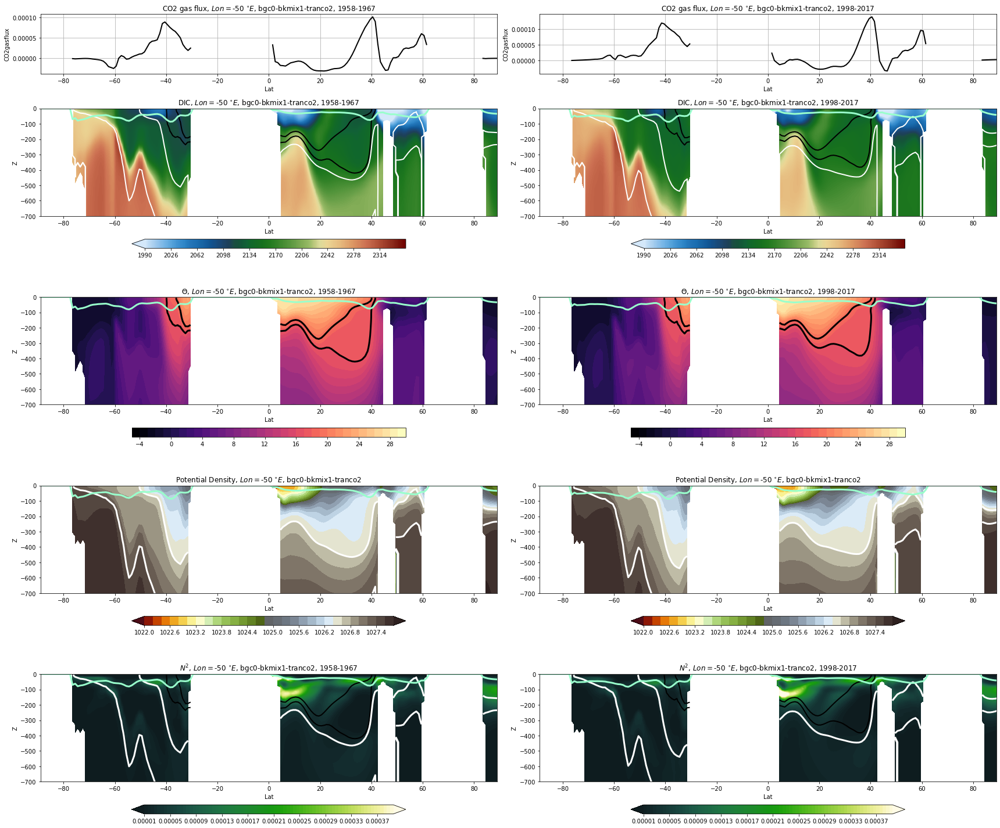

In [17]:
%%time

plt.figure(figsize=(24,20), tight_layout=True)

lt = -50
lab = labels[0]
timeslices = [slice('1958','1967'),slice('1998','2017')] 

for i, timeslice in enumerate(timeslices):
    

    plt.subplot2grid((9,2),(0,i), rowspan=1)
    ds_r[lab].where(pdmask[lab].isel(Z=0)).sel(time=timeslice).sel(lon=lt,  method='nearest').CO2gasflux.mean(dim='time').plot(label = 'mean', color = 'k', linewidth=2)
    plt.title(r'CO2 gas flux, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.grid()
    plt.xlim([-89,89]);
    plt.xlabel('Lat')

    plt.subplot2grid((9,2),(1,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').DIC.mean(dim='time').plot.contourf(levels=np.arange(1990, 2350, 0.2), cmap='3Wbgy5', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=2, add_labels=False)
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'DIC, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')

    plt.subplot2grid((9,2),(3,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contourf(levels=np.arange(-5, 31, 1), cmap='magma', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$\Theta$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')


    plt.subplot2grid((9,2),(5,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contourf(levels=np.arange(1022, 1028, 0.2),  cmap='orange-green-blue-gray', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'Potential Density, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
    plt.xlabel('Lat')
    plt.ylabel('Z')



    plt.subplot2grid((9,2),(7,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').BruntVaisalaFreqTop.mean(dim='time').plot.contourf(levels=np.arange(1e-5,4e-4, 5e-6), cmap='green-1', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$N^2$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')





CPU times: user 2min 16s, sys: 2min 1s, total: 4min 18s
Wall time: 2min 37s


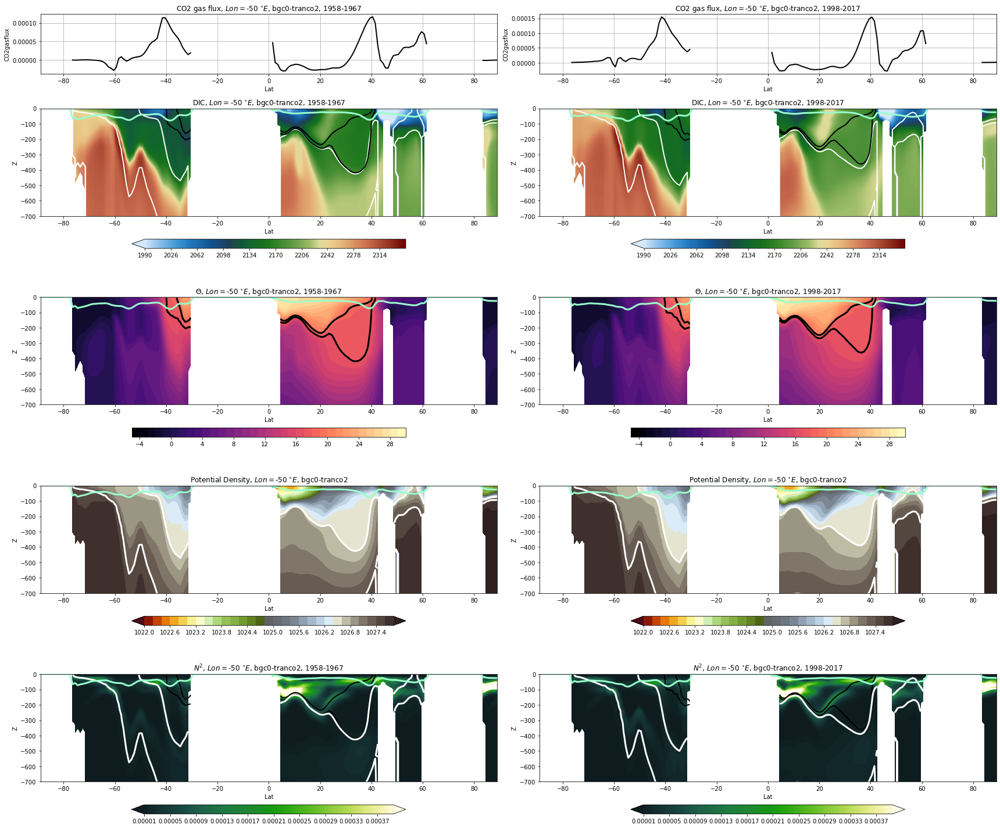

In [46]:
%%time

plt.figure(figsize=(24,20), tight_layout=True)

lt = -50
lab = labels[1]
timeslices = [slice('1958','1967'),slice('1998','2017')] 

for i, timeslice in enumerate(timeslices):
    

    plt.subplot2grid((9,2),(0,i), rowspan=1)
    ds_r[lab].where(pdmask[lab].isel(Z=0)).sel(time=timeslice).sel(lon=lt,  method='nearest').CO2gasflux.mean(dim='time').plot(label = 'mean', color = 'k', linewidth=2)
    plt.title(r'CO2 gas flux, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.grid()
    plt.xlim([-89,89]);
    plt.xlabel('Lat')

    plt.subplot2grid((9,2),(1,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').DIC.mean(dim='time').plot.contourf(levels=np.arange(1990, 2350, 0.2), cmap='3Wbgy5', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=2, add_labels=False)
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'DIC, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')

    plt.subplot2grid((9,2),(3,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contourf(levels=np.arange(-5, 31, 1), cmap='magma', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$\Theta$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')


    plt.subplot2grid((9,2),(5,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contourf(levels=np.arange(1022, 1028, 0.2),  cmap='orange-green-blue-gray', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'Potential Density, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
    plt.xlabel('Lat')
    plt.ylabel('Z')



    plt.subplot2grid((9,2),(7,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').BruntVaisalaFreqTop.mean(dim='time').plot.contourf(levels=np.arange(1e-5,4e-4, 5e-6), cmap='green-1', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$N^2$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')




CPU times: user 2min 11s, sys: 2min 18s, total: 4min 30s
Wall time: 4min 25s


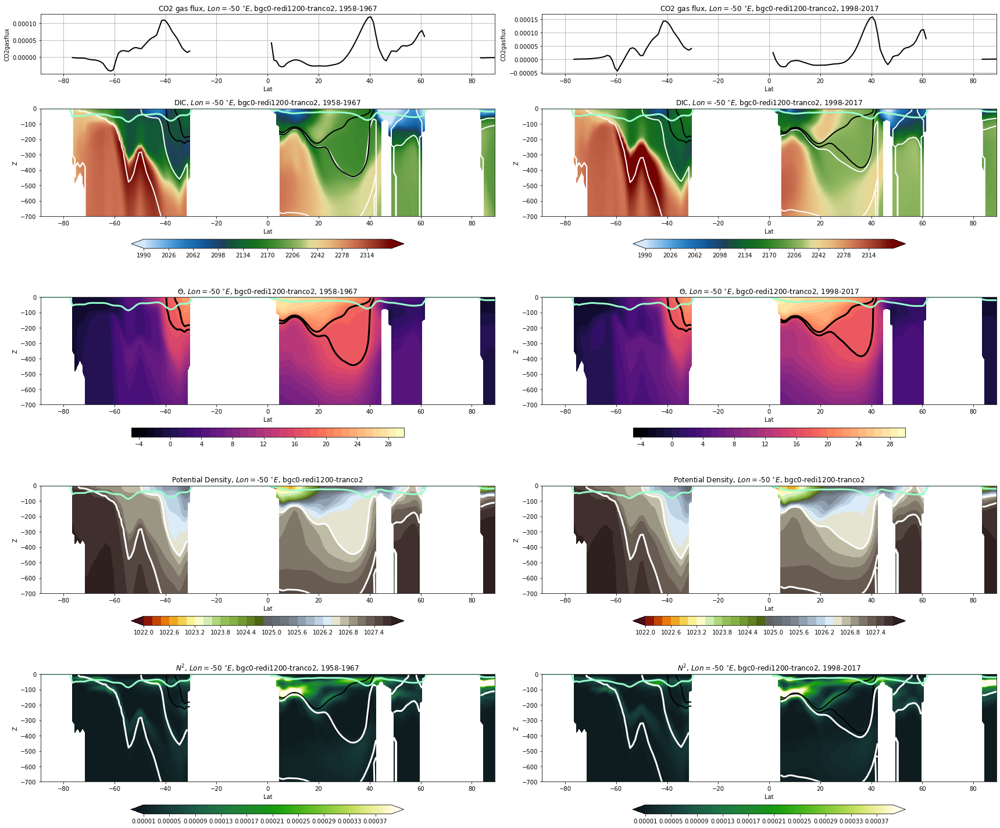

In [18]:
%%time

plt.figure(figsize=(24,20), tight_layout=True)

lt = -50
lab = labels[2]
timeslices = [slice('1958','1967'),slice('1998','2017')] 

for i, timeslice in enumerate(timeslices):
    

    plt.subplot2grid((9,2),(0,i), rowspan=1)
    ds_r[lab].where(pdmask[lab].isel(Z=0)).sel(time=timeslice).sel(lon=lt,  method='nearest').CO2gasflux.mean(dim='time').plot(label = 'mean', color = 'k', linewidth=2)
    plt.title(r'CO2 gas flux, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.grid()
    plt.xlim([-89,89]);
    plt.xlabel('Lat')

    plt.subplot2grid((9,2),(1,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').DIC.mean(dim='time').plot.contourf(levels=np.arange(1990, 2350, 0.2), cmap='3Wbgy5', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=2, add_labels=False)
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'DIC, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')

    plt.subplot2grid((9,2),(3,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contourf(levels=np.arange(-5, 31, 1), cmap='magma', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$\Theta$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')


    plt.subplot2grid((9,2),(5,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contourf(levels=np.arange(1022, 1028, 0.2),  cmap='orange-green-blue-gray', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'Potential Density, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
    plt.xlabel('Lat')
    plt.ylabel('Z')



    plt.subplot2grid((9,2),(7,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').BruntVaisalaFreqTop.mean(dim='time').plot.contourf(levels=np.arange(1e-5,4e-4, 5e-6), cmap='green-1', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$N^2$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')





CPU times: user 2min 11s, sys: 2min 15s, total: 4min 26s
Wall time: 3min 58s


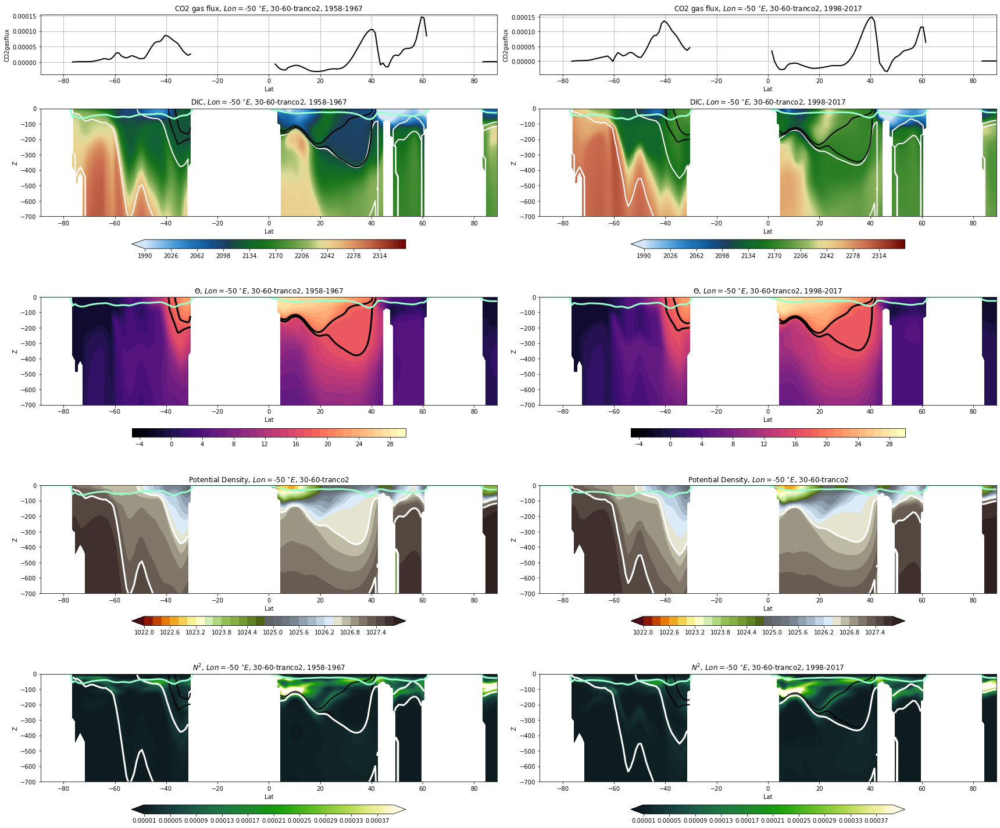

In [19]:
%%time

plt.figure(figsize=(24,20), tight_layout=True)

lt = -50
lab = labels[3]
timeslices = [slice('1958','1967'),slice('1998','2017')] 

for i, timeslice in enumerate(timeslices):
    

    plt.subplot2grid((9,2),(0,i), rowspan=1)
    ds_r[lab].where(pdmask[lab].isel(Z=0)).sel(time=timeslice).sel(lon=lt,  method='nearest').CO2gasflux.mean(dim='time').plot(label = 'mean', color = 'k', linewidth=2)
    plt.title(r'CO2 gas flux, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.grid()
    plt.xlim([-89,89]);
    plt.xlabel('Lat')

    plt.subplot2grid((9,2),(1,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').DIC.mean(dim='time').plot.contourf(levels=np.arange(1990, 2350, 0.2), cmap='3Wbgy5', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=2, add_labels=False)
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'DIC, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')

    plt.subplot2grid((9,2),(3,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contourf(levels=np.arange(-5, 31, 1), cmap='magma', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$\Theta$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')


    plt.subplot2grid((9,2),(5,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contourf(levels=np.arange(1022, 1028, 0.2),  cmap='orange-green-blue-gray', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'Potential Density, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
    plt.xlabel('Lat')
    plt.ylabel('Z')



    plt.subplot2grid((9,2),(7,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').BruntVaisalaFreqTop.mean(dim='time').plot.contourf(levels=np.arange(1e-5,4e-4, 5e-6), cmap='green-1', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$N^2$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')






CPU times: user 2min 45s, sys: 2min 13s, total: 4min 59s
Wall time: 4min 20s


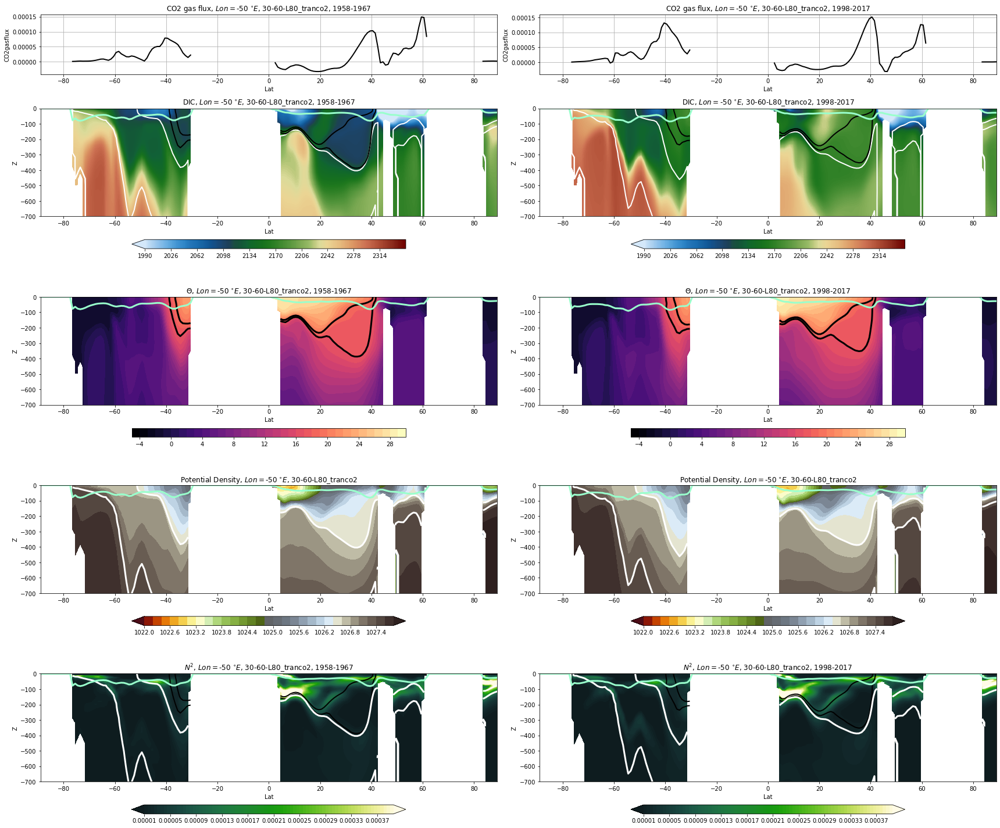

In [47]:
%%time

plt.figure(figsize=(24,20), tight_layout=True)

lt = -50
lab = labels[4]
timeslices = [slice('1958','1967'),slice('1998','2017')] 

for i, timeslice in enumerate(timeslices):
    

    plt.subplot2grid((9,2),(0,i), rowspan=1)
    ds_r[lab].where(pdmask[lab].isel(Z=0)).sel(time=timeslice).sel(lon=lt,  method='nearest').CO2gasflux.mean(dim='time').plot(label = 'mean', color = 'k', linewidth=2)
    plt.title(r'CO2 gas flux, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.grid()
    plt.xlim([-89,89]);
    plt.xlabel('Lat')

    plt.subplot2grid((9,2),(1,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').DIC.mean(dim='time').plot.contourf(levels=np.arange(1990, 2350, 0.2), cmap='3Wbgy5', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=2, add_labels=False)
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'DIC, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')

    plt.subplot2grid((9,2),(3,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contourf(levels=np.arange(-5, 31, 1), cmap='magma', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$\Theta$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')


    plt.subplot2grid((9,2),(5,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contourf(levels=np.arange(1022, 1028, 0.2),  cmap='orange-green-blue-gray', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'Potential Density, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
    plt.xlabel('Lat')
    plt.ylabel('Z')



    plt.subplot2grid((9,2),(7,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').BruntVaisalaFreqTop.mean(dim='time').plot.contourf(levels=np.arange(1e-5,4e-4, 5e-6), cmap='green-1', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$N^2$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')





CPU times: user 2min 9s, sys: 2min 29s, total: 4min 39s
Wall time: 4min 31s


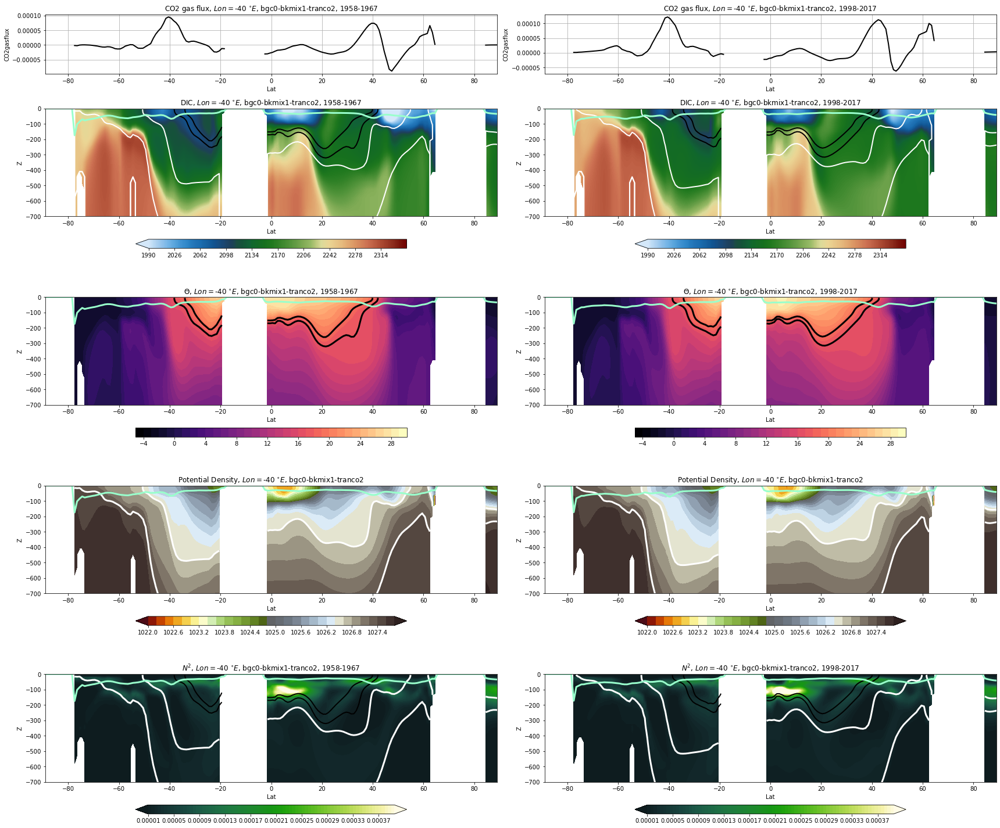

In [20]:
%%time

plt.figure(figsize=(24,20), tight_layout=True)

lt = -40
lab = labels[0]
timeslices = [slice('1958','1967'),slice('1998','2017')] 

for i, timeslice in enumerate(timeslices):
    

    plt.subplot2grid((9,2),(0,i), rowspan=1)
    ds_r[lab].where(pdmask[lab].isel(Z=0)).sel(time=timeslice).sel(lon=lt,  method='nearest').CO2gasflux.mean(dim='time').plot(label = 'mean', color = 'k', linewidth=2)
    plt.title(r'CO2 gas flux, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.grid()
    plt.xlim([-89,89]);
    plt.xlabel('Lat')

    plt.subplot2grid((9,2),(1,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').DIC.mean(dim='time').plot.contourf(levels=np.arange(1990, 2350, 0.2), cmap='3Wbgy5', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=2, add_labels=False)
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'DIC, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')

    plt.subplot2grid((9,2),(3,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contourf(levels=np.arange(-5, 31, 1), cmap='magma', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$\Theta$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')


    plt.subplot2grid((9,2),(5,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contourf(levels=np.arange(1022, 1028, 0.2),  cmap='orange-green-blue-gray', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'Potential Density, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
    plt.xlabel('Lat')
    plt.ylabel('Z')



    plt.subplot2grid((9,2),(7,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').BruntVaisalaFreqTop.mean(dim='time').plot.contourf(levels=np.arange(1e-5,4e-4, 5e-6), cmap='green-1', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$N^2$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')







CPU times: user 2min 18s, sys: 2min 8s, total: 4min 26s
Wall time: 3min 22s


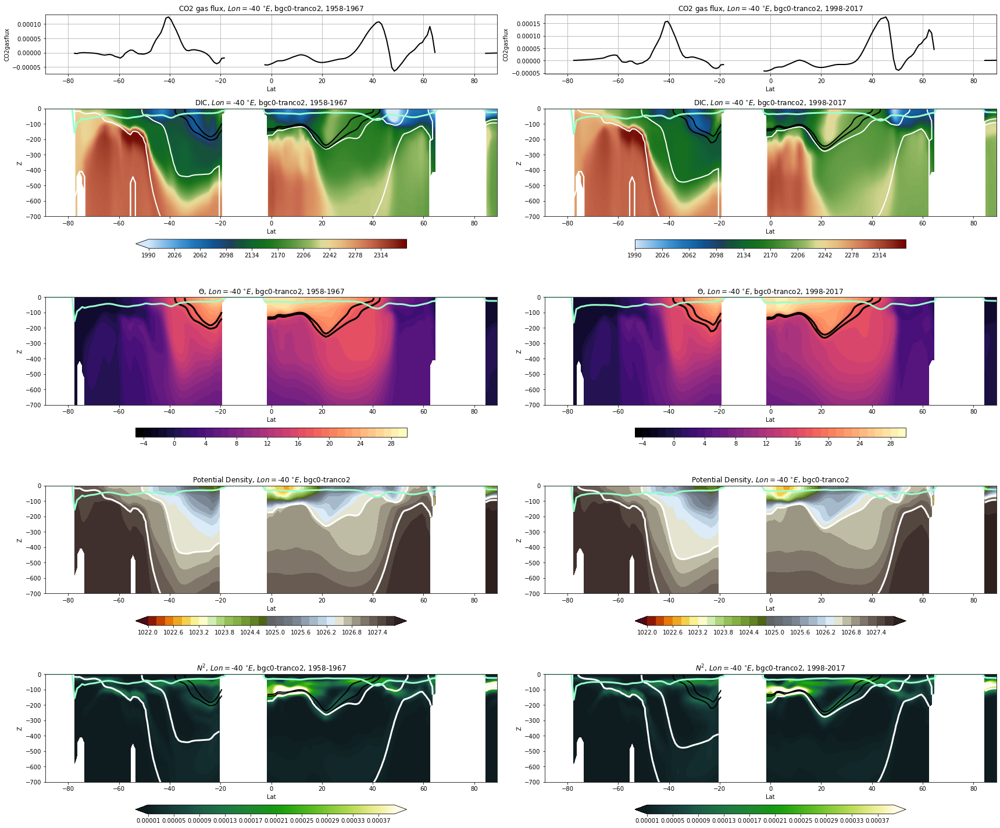

In [48]:
%%time

plt.figure(figsize=(24,20), tight_layout=True)

lt = -40
lab = labels[1]
timeslices = [slice('1958','1967'),slice('1998','2017')] 

for i, timeslice in enumerate(timeslices):
    

    plt.subplot2grid((9,2),(0,i), rowspan=1)
    ds_r[lab].where(pdmask[lab].isel(Z=0)).sel(time=timeslice).sel(lon=lt,  method='nearest').CO2gasflux.mean(dim='time').plot(label = 'mean', color = 'k', linewidth=2)
    plt.title(r'CO2 gas flux, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.grid()
    plt.xlim([-89,89]);
    plt.xlabel('Lat')

    plt.subplot2grid((9,2),(1,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').DIC.mean(dim='time').plot.contourf(levels=np.arange(1990, 2350, 0.2), cmap='3Wbgy5', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=2, add_labels=False)
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'DIC, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')

    plt.subplot2grid((9,2),(3,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contourf(levels=np.arange(-5, 31, 1), cmap='magma', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$\Theta$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')


    plt.subplot2grid((9,2),(5,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contourf(levels=np.arange(1022, 1028, 0.2),  cmap='orange-green-blue-gray', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'Potential Density, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
    plt.xlabel('Lat')
    plt.ylabel('Z')



    plt.subplot2grid((9,2),(7,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').BruntVaisalaFreqTop.mean(dim='time').plot.contourf(levels=np.arange(1e-5,4e-4, 5e-6), cmap='green-1', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$N^2$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')






CPU times: user 2min 10s, sys: 2min 14s, total: 4min 24s
Wall time: 3min 53s


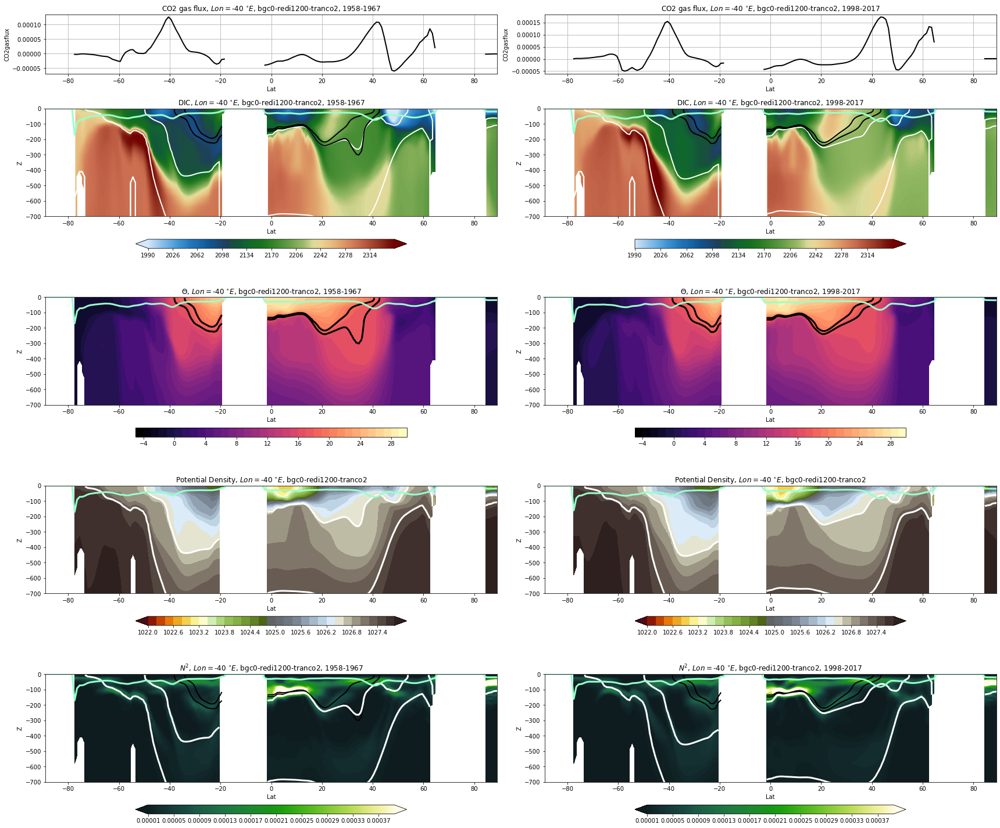

In [21]:
%%time

plt.figure(figsize=(24,20), tight_layout=True)

lt = -40
lab = labels[2]
timeslices = [slice('1958','1967'),slice('1998','2017')] 

for i, timeslice in enumerate(timeslices):
    

    plt.subplot2grid((9,2),(0,i), rowspan=1)
    ds_r[lab].where(pdmask[lab].isel(Z=0)).sel(time=timeslice).sel(lon=lt,  method='nearest').CO2gasflux.mean(dim='time').plot(label = 'mean', color = 'k', linewidth=2)
    plt.title(r'CO2 gas flux, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.grid()
    plt.xlim([-89,89]);
    plt.xlabel('Lat')

    plt.subplot2grid((9,2),(1,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').DIC.mean(dim='time').plot.contourf(levels=np.arange(1990, 2350, 0.2), cmap='3Wbgy5', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=2, add_labels=False)
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'DIC, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')

    plt.subplot2grid((9,2),(3,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contourf(levels=np.arange(-5, 31, 1), cmap='magma', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$\Theta$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')


    plt.subplot2grid((9,2),(5,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contourf(levels=np.arange(1022, 1028, 0.2),  cmap='orange-green-blue-gray', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'Potential Density, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
    plt.xlabel('Lat')
    plt.ylabel('Z')



    plt.subplot2grid((9,2),(7,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').BruntVaisalaFreqTop.mean(dim='time').plot.contourf(levels=np.arange(1e-5,4e-4, 5e-6), cmap='green-1', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$N^2$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')







CPU times: user 2min 9s, sys: 2min 24s, total: 4min 33s
Wall time: 4min 9s


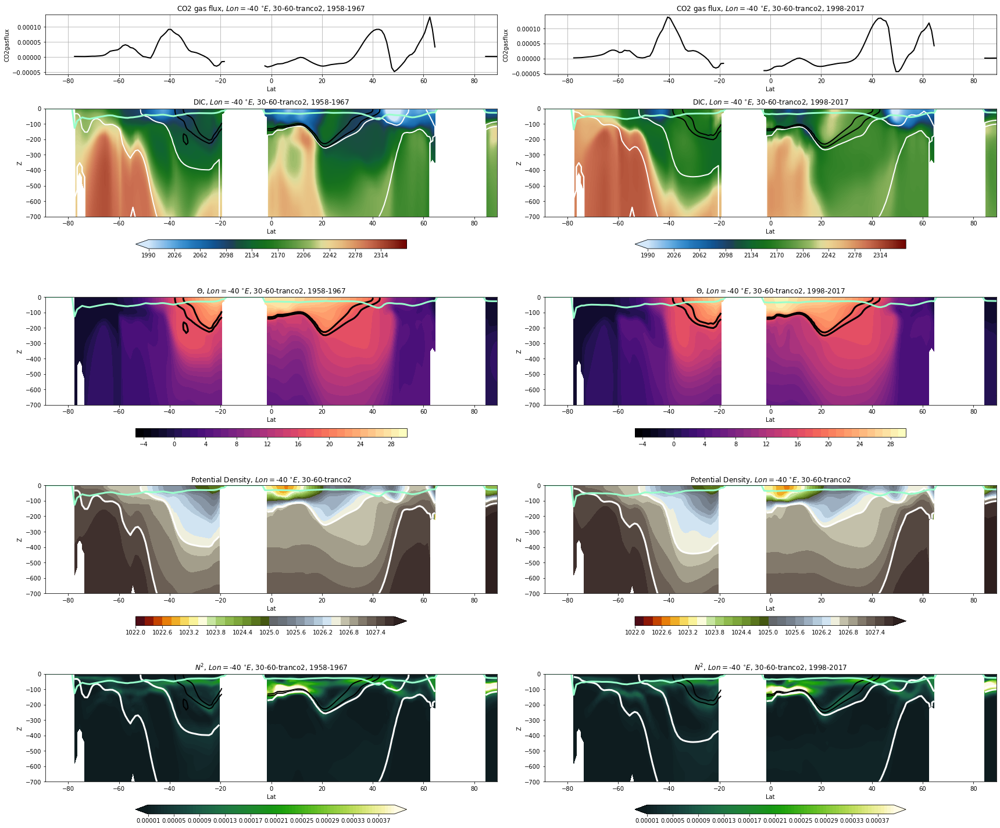

In [22]:
%%time

plt.figure(figsize=(24,20), tight_layout=True)

lt = -40
lab = labels[3]
timeslices = [slice('1958','1967'),slice('1998','2017')] 

for i, timeslice in enumerate(timeslices):
    

    plt.subplot2grid((9,2),(0,i), rowspan=1)
    ds_r[lab].where(pdmask[lab].isel(Z=0)).sel(time=timeslice).sel(lon=lt,  method='nearest').CO2gasflux.mean(dim='time').plot(label = 'mean', color = 'k', linewidth=2)
    plt.title(r'CO2 gas flux, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.grid()
    plt.xlim([-89,89]);
    plt.xlabel('Lat')

    plt.subplot2grid((9,2),(1,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').DIC.mean(dim='time').plot.contourf(levels=np.arange(1990, 2350, 0.2), cmap='3Wbgy5', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=2, add_labels=False)
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'DIC, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')

    plt.subplot2grid((9,2),(3,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contourf(levels=np.arange(-5, 31, 1), cmap='magma', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$\Theta$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')


    plt.subplot2grid((9,2),(5,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contourf(levels=np.arange(1022, 1028, 0.2),  cmap='orange-green-blue-gray', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'Potential Density, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
    plt.xlabel('Lat')
    plt.ylabel('Z')



    plt.subplot2grid((9,2),(7,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').BruntVaisalaFreqTop.mean(dim='time').plot.contourf(levels=np.arange(1e-5,4e-4, 5e-6), cmap='green-1', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$N^2$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')







CPU times: user 2min 42s, sys: 2min 7s, total: 4min 50s
Wall time: 3min 5s


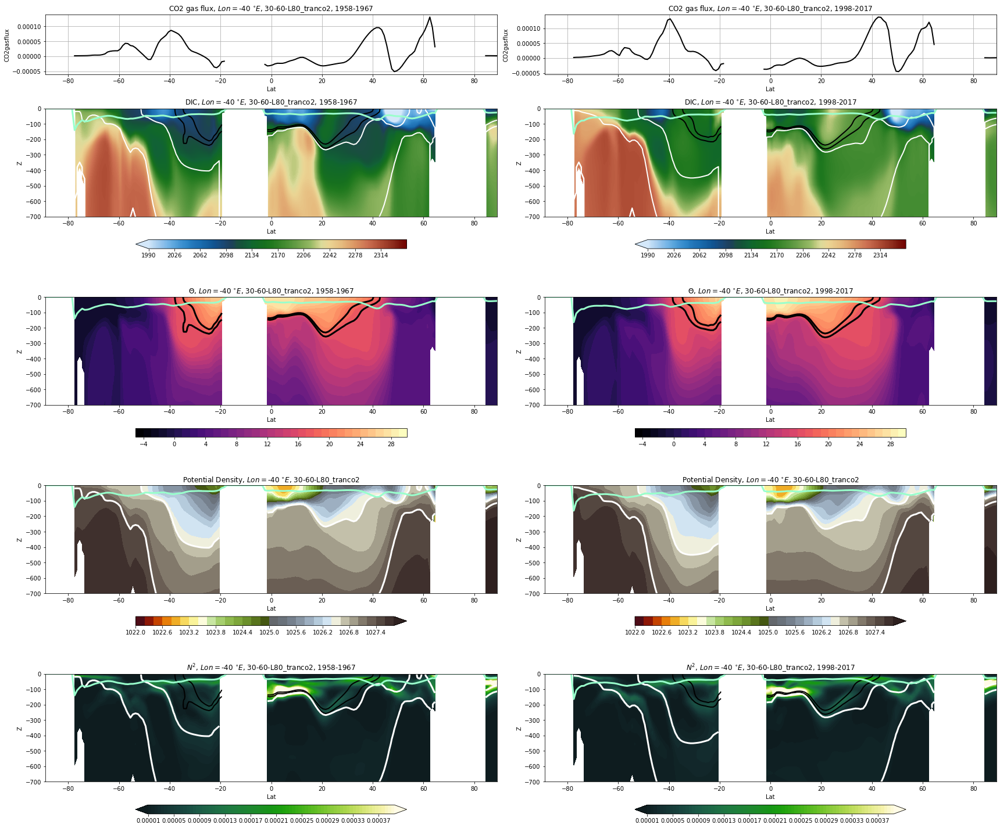

In [49]:
%%time

plt.figure(figsize=(24,20), tight_layout=True)

lt = -40
lab = labels[4]
timeslices = [slice('1958','1967'),slice('1998','2017')] 

for i, timeslice in enumerate(timeslices):
    

    plt.subplot2grid((9,2),(0,i), rowspan=1)
    ds_r[lab].where(pdmask[lab].isel(Z=0)).sel(time=timeslice).sel(lon=lt,  method='nearest').CO2gasflux.mean(dim='time').plot(label = 'mean', color = 'k', linewidth=2)
    plt.title(r'CO2 gas flux, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.grid()
    plt.xlim([-89,89]);
    plt.xlabel('Lat')

    plt.subplot2grid((9,2),(1,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').DIC.mean(dim='time').plot.contourf(levels=np.arange(1990, 2350, 0.2), cmap='3Wbgy5', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=2, add_labels=False)
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'DIC, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')

    plt.subplot2grid((9,2),(3,i), rowspan=2)

    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contourf(levels=np.arange(-5, 31, 1), cmap='magma', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$\Theta$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')


    plt.subplot2grid((9,2),(5,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contourf(levels=np.arange(1022, 1028, 0.2),  cmap='orange-green-blue-gray', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'Potential Density, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
    plt.xlabel('Lat')
    plt.ylabel('Z')



    plt.subplot2grid((9,2),(7,i), rowspan=2)

    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').BruntVaisalaFreqTop.mean(dim='time').plot.contourf(levels=np.arange(1e-5,4e-4, 5e-6), cmap='green-1', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
    ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
    ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
    (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

    plt.xlim([-89,89]);
    plt.ylim([-700,0]);
    plt.title(r'$N^2$, $Lon=$%s $^{\circ}E$, %s, %s-%s' %(lt, lab, timeslice.start, timeslice.stop));
    plt.xlabel('Lat')
    plt.ylabel('Z')





In [23]:
mw_mask = {}
isopycnal_26_mask = {}
isopycnal_27_mask = {}
for lab in labels[:-1]:
    mw_mask[lab] = (ds_r[lab].temperature<19)&(ds_r[lab].temperature>17)
    isopycnal_26_mask[lab] = (ds_r[lab].potentialDensity<=1026.6)&(ds_r[lab].potentialDensity>1022)
    isopycnal_27_mask[lab] = (ds_r[lab].potentialDensity<=1027.4)&(ds_r[lab].potentialDensity>1026.6)


mw_DIC = {}
isopycnal_26_DIC = {}
isopycnal_27_DIC = {}

for lab in labels[:-1]:
    mw_DIC[lab] = ds_r[lab].DIC.where(mw_mask[lab])
    isopycnal_26_DIC[lab] = ds_r[lab].DIC.where(isopycnal_26_mask[lab])
    isopycnal_27_DIC[lab] = ds_r[lab].DIC.where(isopycnal_27_mask[lab])


    

In [37]:
%%time

mw_DIC_decade = {}
isopycnal_26_DIC_decade = {}
isopycnal_27_DIC_decade = {} 
timeslices = [slice('1958','1967'),slice('1998','2017')] 

for i, timeslice in enumerate(timeslices):
    for lab in labels[:-1]:
        mw_DIC_decade[lab+str(i)] = mw_DIC[lab].sel(time=timeslice).mean(dim='Z').mean(dim='time')
        isopycnal_26_DIC_decade[lab+str(i)] = isopycnal_26_DIC[lab].sel(time=timeslice).mean(dim='Z').mean(dim='time')
        isopycnal_27_DIC_decade[lab+str(i)] = isopycnal_27_DIC[lab].sel(time=timeslice).mean(dim='Z').mean(dim='time')
        print(i, timeslice)
        mw_DIC_decade[lab+str(i)] = mw_DIC_decade[lab+str(i)].load()
        isopycnal_26_DIC_decade[lab+str(i)] = isopycnal_26_DIC_decade[lab+str(i)].load()
        isopycnal_27_DIC_decade[lab+str(i)] = isopycnal_27_DIC_decade[lab+str(i)].load()
        print(lab, i, timeslice)


0 slice('1958', '1967', None)
bgc0-bkmix1-tranco2 0 slice('1958', '1967', None)
0 slice('1958', '1967', None)
bgc0-tranco2 0 slice('1958', '1967', None)
0 slice('1958', '1967', None)
bgc0-redi1200-tranco2 0 slice('1958', '1967', None)
0 slice('1958', '1967', None)
30-60-tranco2 0 slice('1958', '1967', None)
0 slice('1958', '1967', None)
30-60-L80_tranco2 0 slice('1958', '1967', None)
1 slice('1998', '2017', None)
bgc0-bkmix1-tranco2 1 slice('1998', '2017', None)
1 slice('1998', '2017', None)
bgc0-tranco2 1 slice('1998', '2017', None)
1 slice('1998', '2017', None)
bgc0-redi1200-tranco2 1 slice('1998', '2017', None)
1 slice('1998', '2017', None)
30-60-tranco2 1 slice('1998', '2017', None)
1 slice('1998', '2017', None)
30-60-L80_tranco2 1 slice('1998', '2017', None)
CPU times: user 6min 30s, sys: 4min 41s, total: 11min 11s
Wall time: 10min 17s


In [25]:
color2 = '#6495ed'
color1 = '#ff6347'
color5 = '#8470ff'
color3 = '#3cb371'
color4 = '#ffd700'
color6 = '#ba55d3'
color7 = '#b38f00'
color8 = '#00e6e6'
color9 = '#666699'
colores = [color1, color2, color3, color4, color5]

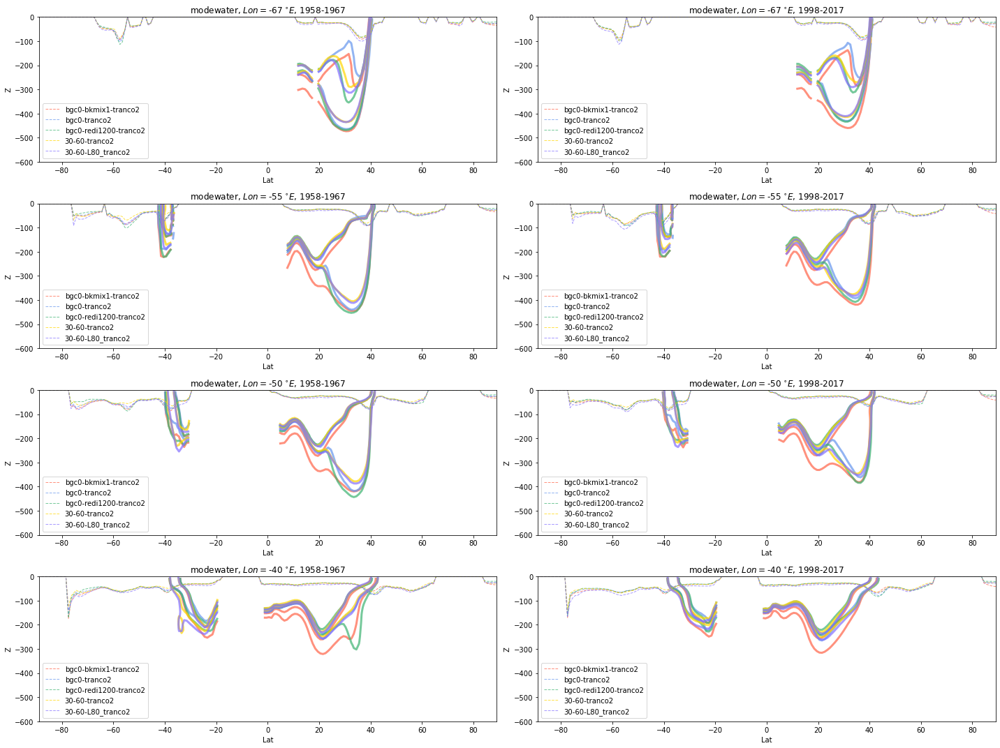

In [57]:
plt.figure(figsize=(20,15), tight_layout=True)
timeslices = [slice('1958','1967'),slice('1998','2017')] 

for j, timeslice in enumerate(timeslices):
    for i, lt in enumerate([-67, -55, -50, -40]):
        plt.subplot2grid((4,2),(i,j))
        
        for it, lab in enumerate(labels[:-1]):
            ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors=colores[it], linewidths=3, add_labels=False, alpha=0.7)
            (-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color=colores[it], linewidth=1, linestyle='dashed', alpha=0.7, label=lab)
        plt.xlim([-89,89]);
        plt.ylim([-600,0]);
        plt.title(r'modewater, $Lon=$%s $^{\circ}E$, %s-%s' %(lt, timeslice.start, timeslice.stop));
        plt.xlabel('Lat')
        plt.ylabel('Z')
        plt.legend(loc=0)

    

CPU times: user 3min 50s, sys: 3min 4s, total: 6min 55s
Wall time: 6min 18s


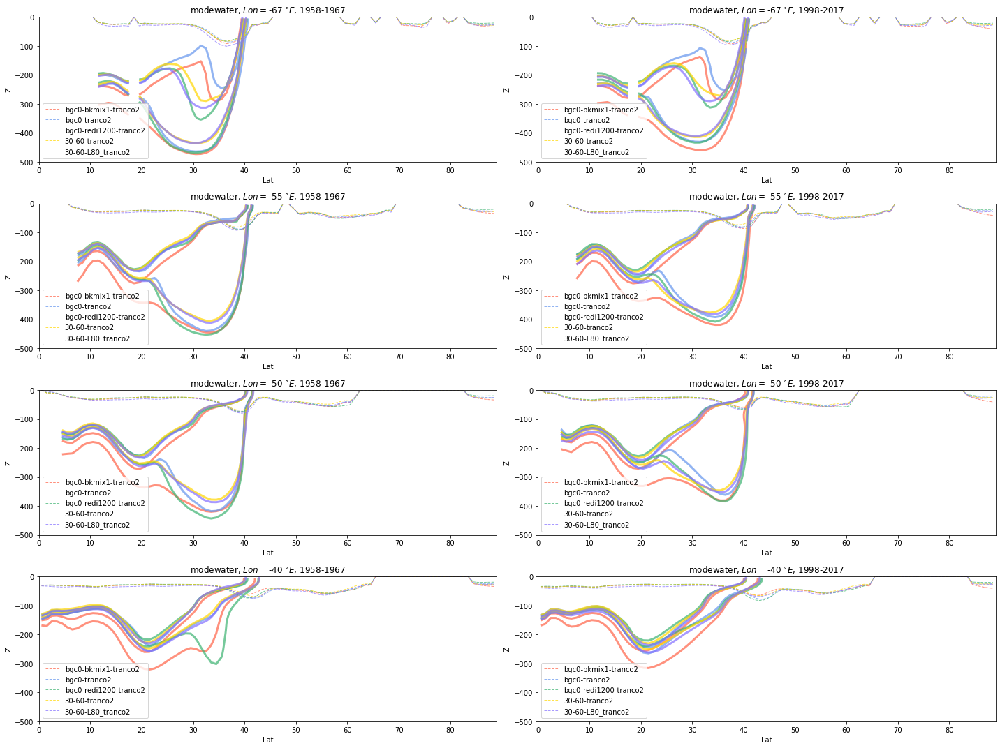

In [26]:
%%time

plt.figure(figsize=(20,15), tight_layout=True)
timeslices = [slice('1958','1967'),slice('1998','2017')] 

for j, timeslice in enumerate(timeslices):
    for i, lt in enumerate([-67, -55, -50, -40]):
        plt.subplot2grid((4,2),(i,j))
        
        for it, lab in enumerate(labels[:-1]):
            ds_r[lab].sel(Z = slice(0,-800), time=timeslice, lat=slice(0,89)).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors=colores[it], linewidths=3, add_labels=False, alpha=0.7)
            (-ds_r[lab].sel(time=timeslice, lat=slice(0,89)).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color=colores[it], linewidth=1, linestyle='dashed', alpha=0.7, label=lab)
        plt.xlim([0,89]);
        plt.ylim([-500,0]);
        plt.title(r'modewater, $Lon=$%s $^{\circ}E$, %s-%s' %(lt, timeslice.start, timeslice.stop));
        plt.xlabel('Lat')
        plt.ylabel('Z')
        plt.legend(loc=0)


In [72]:
%%time

plt.figure(figsize=(25,15), tight_layout=True)
timeslices = [slice('1958','1967'),slice('1978','1987'),slice('1998','2017')] 

for j, timeslice in enumerate(timeslices):
    for i, lt in enumerate([-67, -55, -50, -40]):
        plt.subplot2grid((4,3),(i,j))
        
        for it, lab in enumerate(labels[:-1]):
            ds_r[lab].sel(Z = slice(0,-800), time=timeslice, lat=slice(0,89)).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors=colores[it], linewidths=3, add_labels=False, alpha=0.7)
            (-ds_r[lab].sel(time=timeslice, lat=slice(0,89)).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color=colores[it], linewidth=1, linestyle='dashed', alpha=0.7, label=lab)
        plt.xlim([0,89]);
        plt.ylim([-500,0]);
        plt.title(r'modewater, $Lon=$%s $^{\circ}E$, %s-%s' %(lt, timeslice.start, timeslice.stop));
        plt.xlabel('Lat')
        plt.ylabel('Z')
        plt.legend(loc=0)



,Array,Chunk
Bytes,13.92 GiB,19.78 MiB
Shape,"(721, 80, 180, 360)","(1, 80, 180, 360)"
Count,7210 Tasks,721 Chunks
Type,float32,numpy.ndarray


CPU times: user 1.5 s, sys: 38.2 ms, total: 1.54 s
Wall time: 1.53 s


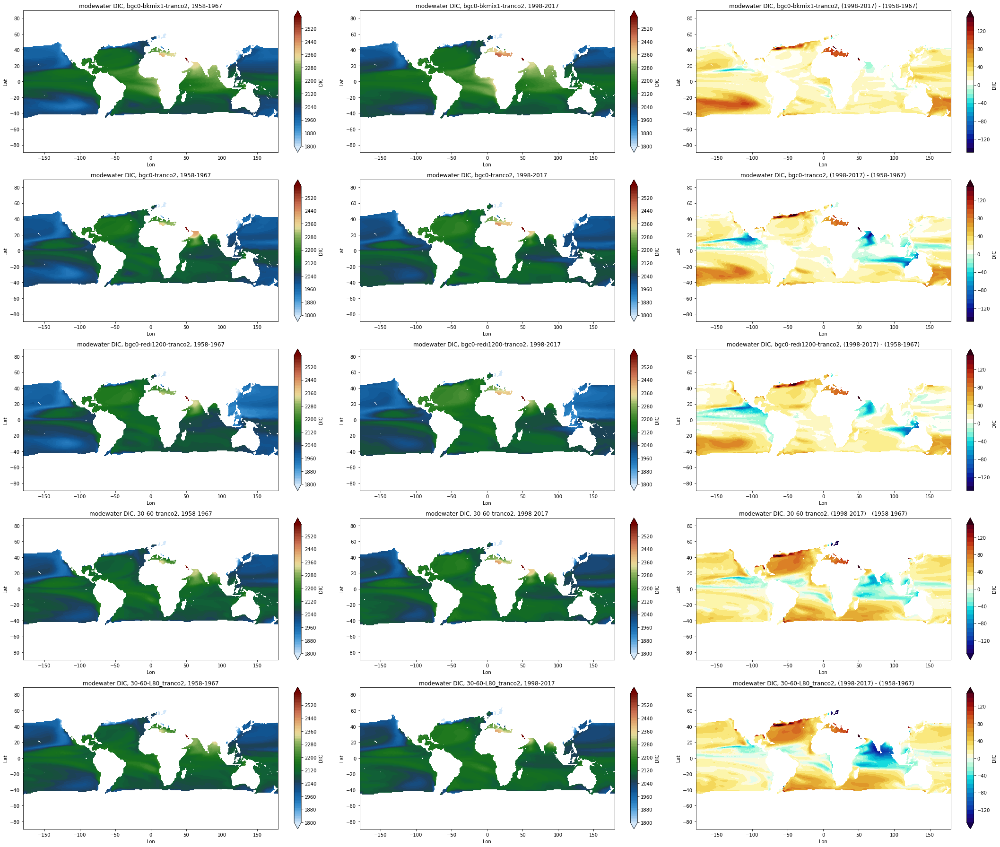

In [34]:
%%time
timeslices = [slice('1958','1967'),slice('1998','2017')] 


plt.figure(figsize=(30,25), tight_layout=True)
for j, timeslice in enumerate(timeslices):
    for i, lab in enumerate(labels[:-1]):
        plt.subplot2grid((5,3),(i,j))
        mw_DIC_decade[lab+str(j)].plot.contourf(levels=np.arange(1800,2600,10), cmap='3Wbgy5')
        plt.title(r'modewater DIC, %s, %s-%s' %(lab, timeslice.start, timeslice.stop));
        plt.ylabel('Lat')
        plt.xlabel('Lon')

for i, lab in enumerate(labels[:-1]):
    plt.subplot2grid((5,3),(i,2))
    (mw_DIC_decade[lab+str(1)] - mw_DIC_decade[lab+str(0)]).plot.contourf(levels=np.arange(-150,155,10), cmap='blue-orange-div')
    plt.title(r'modewater DIC, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')





CPU times: user 3.53 s, sys: 162 ms, total: 3.7 s
Wall time: 3.69 s


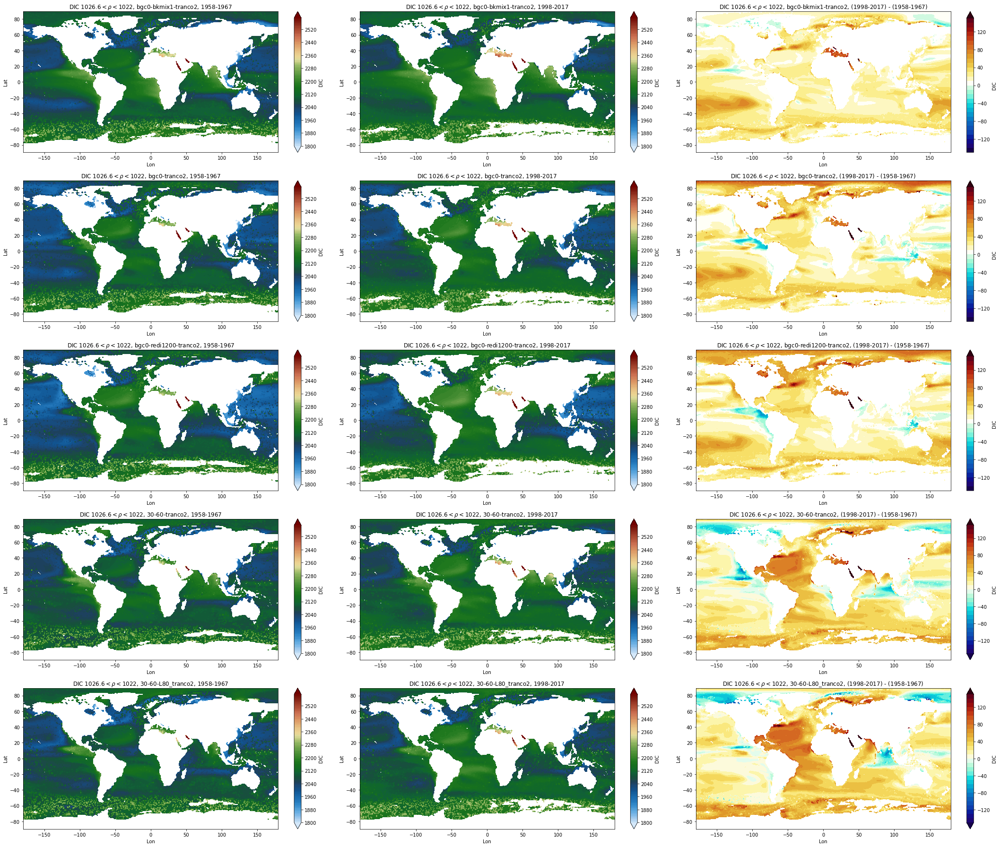

In [38]:
%%time
timeslices = [slice('1958','1967'),slice('1998','2017')] 


plt.figure(figsize=(30,25), tight_layout=True)
for j, timeslice in enumerate(timeslices):
    for i, lab in enumerate(labels[:-1]):
        plt.subplot2grid((5,3),(i,j))
        isopycnal_26_DIC_decade[lab+str(j)].plot.contourf(levels=np.arange(1800,2600,10), cmap='3Wbgy5')
        plt.title(r'DIC $1026.6 < \rho < 1022$, %s, %s-%s' %(lab, timeslice.start, timeslice.stop));
        plt.ylabel('Lat')
        plt.xlabel('Lon')

for i, lab in enumerate(labels[:-1]):
    plt.subplot2grid((5,3),(i,2))
    (isopycnal_26_DIC_decade[lab+str(1)] - isopycnal_26_DIC_decade[lab+str(0)]).plot.contourf(levels=np.arange(-150,155,10), cmap='blue-orange-div')
    plt.title(r'DIC $1026.6 < \rho < 1022$, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')






CPU times: user 5.51 s, sys: 221 ms, total: 5.73 s
Wall time: 5.72 s


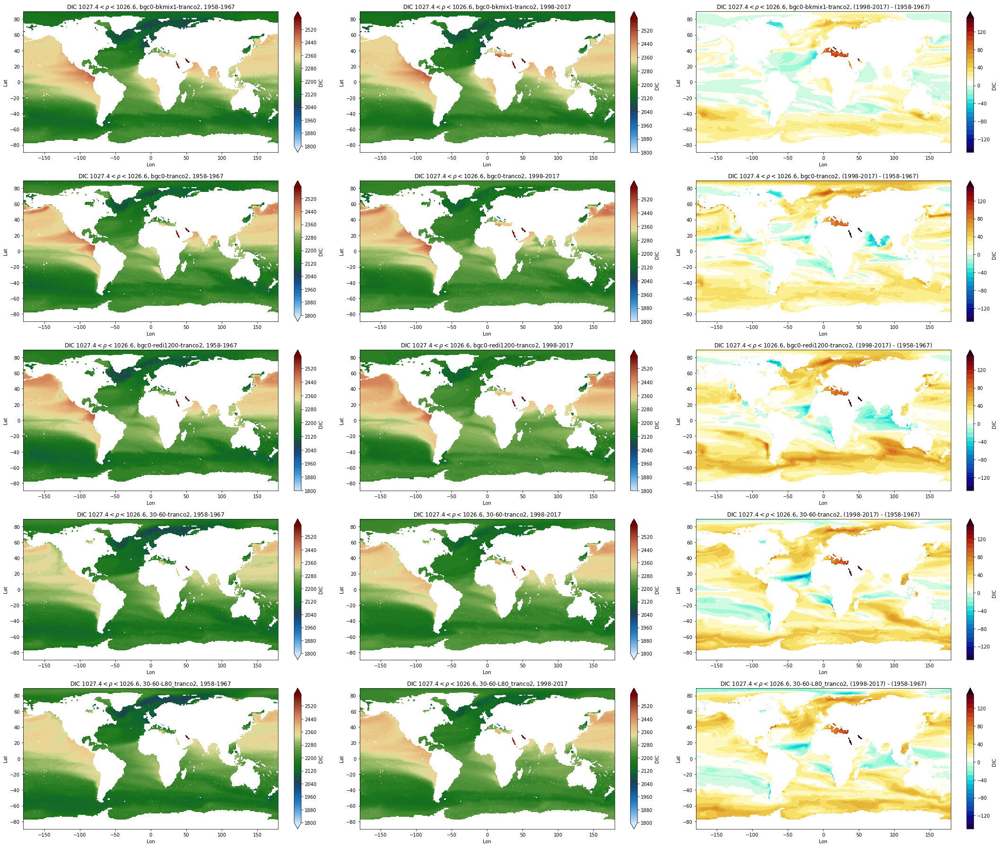

In [39]:
%%time
timeslices = [slice('1958','1967'),slice('1998','2017')] 


plt.figure(figsize=(30,25), tight_layout=True)
for j, timeslice in enumerate(timeslices):
    for i, lab in enumerate(labels[:-1]):
        plt.subplot2grid((5,3),(i,j))
        isopycnal_27_DIC_decade[lab+str(j)].plot.contourf(levels=np.arange(1800,2600,10), cmap='3Wbgy5')
        plt.title(r'DIC $1027.4 < \rho < 1026.6$, %s, %s-%s' %(lab, timeslice.start, timeslice.stop));
        plt.ylabel('Lat')
        plt.xlabel('Lon')

for i, lab in enumerate(labels[:-1]):
    plt.subplot2grid((5,3),(i,2))
    (isopycnal_27_DIC_decade[lab+str(1)] - isopycnal_27_DIC_decade[lab+str(0)]).plot.contourf(levels=np.arange(-150,155,10), cmap='blue-orange-div')
    plt.title(r'DIC $1027.4 < \rho < 1026.6$, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')







In [43]:
%%time

CO2gasflux_decade = {}
SST_decade = {}


for i, timeslice in enumerate(timeslices):
    for lab in labels[:-1]:
        CO2gasflux_decade[lab+str(i)] = ds_r[lab].CO2gasflux.sel(time=timeslice).mean(dim='time')
        SST_decade[lab+str(i)] = ds_r[lab].temperature.isel(Z=0).sel(time=timeslice).mean(dim='time')
        CO2gasflux_decade[lab+str(i)] = CO2gasflux_decade[lab+str(i)].load()
        SST_decade[lab+str(i)] = SST_decade[lab+str(i)].load()
        print(lab, i, timeslice)

bgc0-bkmix1-tranco2 0 slice('1958', '1967', None)
bgc0-tranco2 0 slice('1958', '1967', None)
bgc0-redi1200-tranco2 0 slice('1958', '1967', None)
30-60-tranco2 0 slice('1958', '1967', None)
30-60-L80_tranco2 0 slice('1958', '1967', None)
bgc0-bkmix1-tranco2 1 slice('1998', '2017', None)
bgc0-tranco2 1 slice('1998', '2017', None)
bgc0-redi1200-tranco2 1 slice('1998', '2017', None)
30-60-tranco2 1 slice('1998', '2017', None)
30-60-L80_tranco2 1 slice('1998', '2017', None)
CPU times: user 56.4 s, sys: 46.8 s, total: 1min 43s
Wall time: 3min 56s


CPU times: user 5.96 s, sys: 359 ms, total: 6.32 s
Wall time: 6.31 s


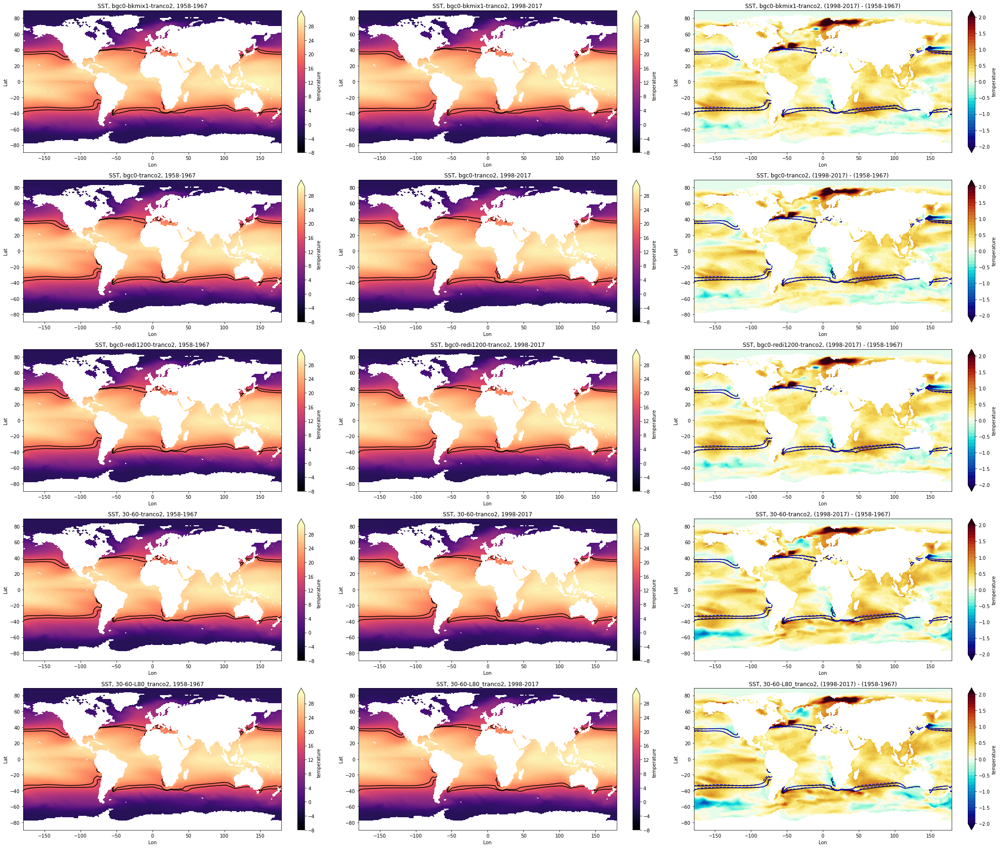

In [47]:
%%time


plt.figure(figsize=(30,25), tight_layout=True)
for j, timeslice in enumerate(timeslices):
    for i, lab in enumerate(labels[:-1]):
        plt.subplot2grid((5,3),(i,j))
        SST_decade[lab+str(j)].plot.contourf(levels=np.arange(-8,31,0.5), cmap='magma')
        SST_decade[lab+str(j)].plot.contour(levels=[17,19], colors='k')
        plt.title(r'SST, %s, %s-%s' %(lab, timeslice.start, timeslice.stop));
        plt.ylabel('Lat')
        plt.xlabel('Lon')

for i, lab in enumerate(labels[:-1]):
    plt.subplot2grid((5,3),(i,2))
    (SST_decade[lab+str(1)] - SST_decade[lab+str(0)]).plot.contourf(levels=np.arange(-2,2.1,0.1), cmap='blue-orange-div')
    SST_decade[lab+str(1)].plot.contour(levels=[17,19], colors='k')
    SST_decade[lab+str(0)].plot.contour(levels=[17,19], colors='b', linestyles='dashed')

    plt.title(r'SST, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')




CPU times: user 2.92 s, sys: 70.1 ms, total: 2.99 s
Wall time: 2.98 s


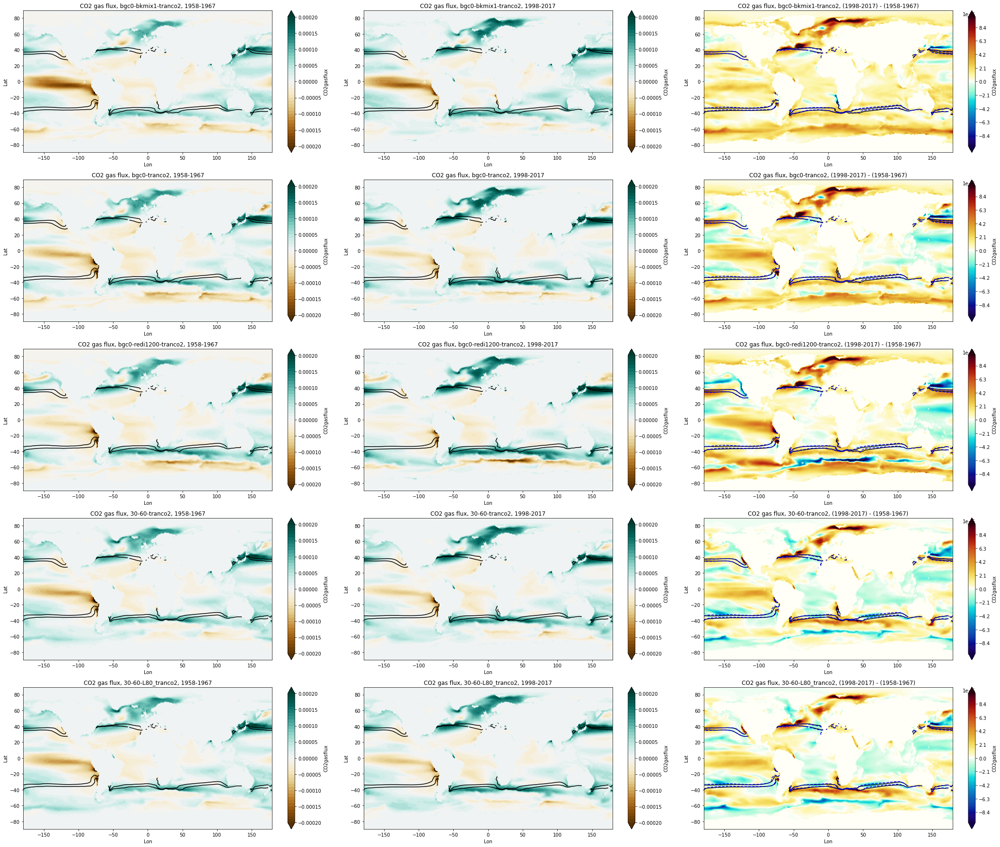

In [52]:
%%time


plt.figure(figsize=(30,25), tight_layout=True)
for j, timeslice in enumerate(timeslices):
    for i, lab in enumerate(labels[:-1]):
        plt.subplot2grid((5,3),(i,j))
        CO2gasflux_decade[lab+str(j)].where(SST_decade[lab+str(j)]).plot.contourf(levels=np.arange(-2e-4,2.05e-4,1e-5), cmap='BrBG')
        SST_decade[lab+str(j)].plot.contour(levels=[17,19], colors='k')
        plt.title(r'CO2 gas flux, %s, %s-%s' %(lab, timeslice.start, timeslice.stop));
        plt.ylabel('Lat')
        plt.xlabel('Lon')

for i, lab in enumerate(labels[:-1]):
    plt.subplot2grid((5,3),(i,2))
    (CO2gasflux_decade[lab+str(1)] - CO2gasflux_decade[lab+str(0)]).where(SST_decade[lab+str(j)]).plot.contourf(levels=np.arange(-1e-4,1.001e-4,1e-6), cmap='blue-orange-div')
    SST_decade[lab+str(1)].plot.contour(levels=[17,19], colors='k')
    SST_decade[lab+str(0)].plot.contour(levels=[17,19], colors='b', linestyles='dashed')
    plt.title(r'CO2 gas flux, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')





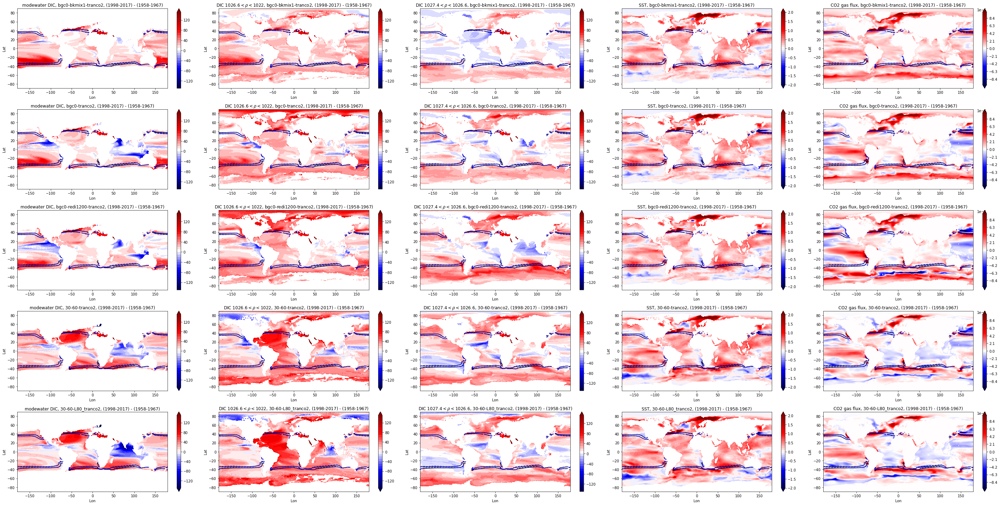

In [56]:
plt.figure(figsize=(40,20), tight_layout=True)
for i, lab in enumerate(labels[:-1]):
    plt.subplot2grid((5,5),(i,0))
    (mw_DIC_decade[lab+str(1)] - mw_DIC_decade[lab+str(0)]).plot.contourf(levels=np.arange(-150,155,10), cmap='seismic', add_labels=False)
    SST_decade[lab+str(1)].plot.contour(levels=[17,19], colors='k')
    SST_decade[lab+str(0)].plot.contour(levels=[17,19], colors='b', linestyles='dashed')    
    plt.title(r'modewater DIC, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')    
    
    plt.subplot2grid((5,5),(i,1))
    (isopycnal_26_DIC_decade[lab+str(1)] - isopycnal_26_DIC_decade[lab+str(0)]).plot.contourf(levels=np.arange(-150,155,10), cmap='seismic', add_labels=False)
    SST_decade[lab+str(1)].plot.contour(levels=[17,19], colors='k')
    SST_decade[lab+str(0)].plot.contour(levels=[17,19], colors='b', linestyles='dashed')
    plt.title(r'DIC $1026.6 < \rho < 1022$, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')
    
    plt.subplot2grid((5,5),(i,2))
    (isopycnal_27_DIC_decade[lab+str(1)] - isopycnal_27_DIC_decade[lab+str(0)]).plot.contourf(levels=np.arange(-150,155,10), cmap='seismic', add_labels=False)
    SST_decade[lab+str(1)].plot.contour(levels=[17,19], colors='k')
    SST_decade[lab+str(0)].plot.contour(levels=[17,19], colors='b', linestyles='dashed')
    plt.title(r'DIC $1027.4 < \rho < 1026.6$, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')
    
    plt.subplot2grid((5,5),(i,3))
    (SST_decade[lab+str(1)] - SST_decade[lab+str(0)]).plot.contourf(levels=np.arange(-2,2.1,0.1), cmap='seismic', add_labels=False)
    SST_decade[lab+str(1)].plot.contour(levels=[17,19], colors='k')
    SST_decade[lab+str(0)].plot.contour(levels=[17,19], colors='b', linestyles='dashed')
    plt.title(r'SST, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')
    
    plt.subplot2grid((5,5),(i,4))
    (CO2gasflux_decade[lab+str(1)] - CO2gasflux_decade[lab+str(0)]).where(SST_decade[lab+str(j)]).plot.contourf(levels=np.arange(-1e-4,1.001e-4,1e-6), cmap='seismic', add_labels=False)
    SST_decade[lab+str(1)].plot.contour(levels=[17,19], colors='k')
    SST_decade[lab+str(0)].plot.contour(levels=[17,19], colors='b', linestyles='dashed')
    plt.title(r'CO2 gas flux, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')



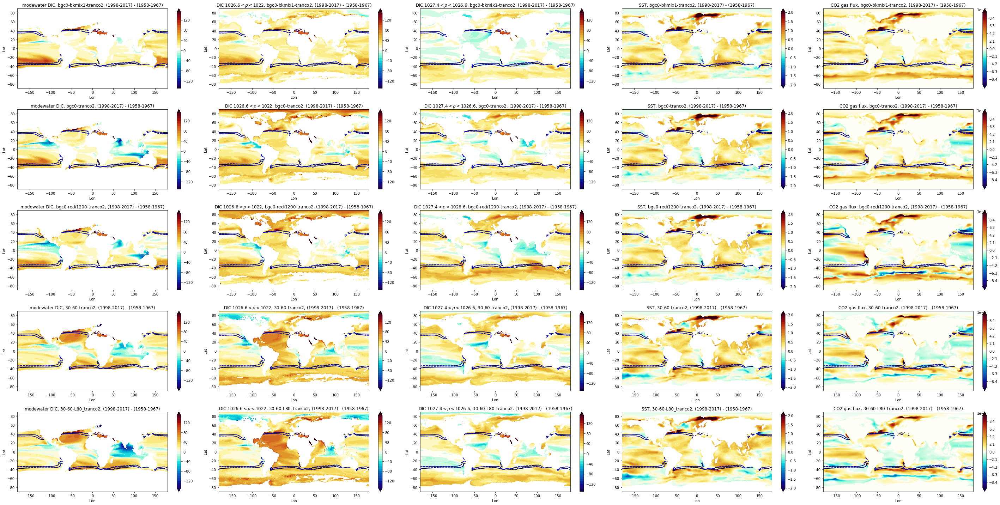

In [55]:
plt.figure(figsize=(40,20), tight_layout=True)
for i, lab in enumerate(labels[:-1]):
    plt.subplot2grid((5,5),(i,0))
    (mw_DIC_decade[lab+str(1)] - mw_DIC_decade[lab+str(0)]).plot.contourf(levels=np.arange(-150,155,10), cmap='blue-orange-div', add_labels=False)
    SST_decade[lab+str(1)].plot.contour(levels=[17,19], colors='k')
    SST_decade[lab+str(0)].plot.contour(levels=[17,19], colors='b', linestyles='dashed')    
    plt.title(r'modewater DIC, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')    
    
    plt.subplot2grid((5,5),(i,1))
    (isopycnal_26_DIC_decade[lab+str(1)] - isopycnal_26_DIC_decade[lab+str(0)]).plot.contourf(levels=np.arange(-150,155,10), cmap='blue-orange-div', add_labels=False)
    SST_decade[lab+str(1)].plot.contour(levels=[17,19], colors='k')
    SST_decade[lab+str(0)].plot.contour(levels=[17,19], colors='b', linestyles='dashed')
    plt.title(r'DIC $1026.6 < \rho < 1022$, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')
    
    plt.subplot2grid((5,5),(i,2))
    (isopycnal_27_DIC_decade[lab+str(1)] - isopycnal_27_DIC_decade[lab+str(0)]).plot.contourf(levels=np.arange(-150,155,10), cmap='blue-orange-div', add_labels=False)
    SST_decade[lab+str(1)].plot.contour(levels=[17,19], colors='k')
    SST_decade[lab+str(0)].plot.contour(levels=[17,19], colors='b', linestyles='dashed')
    plt.title(r'DIC $1027.4 < \rho < 1026.6$, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')
    
    plt.subplot2grid((5,5),(i,3))
    (SST_decade[lab+str(1)] - SST_decade[lab+str(0)]).plot.contourf(levels=np.arange(-2,2.1,0.1), cmap='blue-orange-div', add_labels=False)
    SST_decade[lab+str(1)].plot.contour(levels=[17,19], colors='k')
    SST_decade[lab+str(0)].plot.contour(levels=[17,19], colors='b', linestyles='dashed')
    plt.title(r'SST, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')
    
    plt.subplot2grid((5,5),(i,4))
    (CO2gasflux_decade[lab+str(1)] - CO2gasflux_decade[lab+str(0)]).where(SST_decade[lab+str(j)]).plot.contourf(levels=np.arange(-1e-4,1.001e-4,1e-6), cmap='blue-orange-div', add_labels=False)
    SST_decade[lab+str(1)].plot.contour(levels=[17,19], colors='k')
    SST_decade[lab+str(0)].plot.contour(levels=[17,19], colors='b', linestyles='dashed')
    plt.title(r'CO2 gas flux, %s, (%s-%s) - (%s-%s)' %(lab, timeslices[1].start, timeslices[1].stop, timeslices[0].start, timeslices[0].stop));
    plt.ylabel('Lat')
    plt.xlabel('Lon')


CPU times: user 2min 20s, sys: 1min 52s, total: 4min 12s
Wall time: 4min 19s


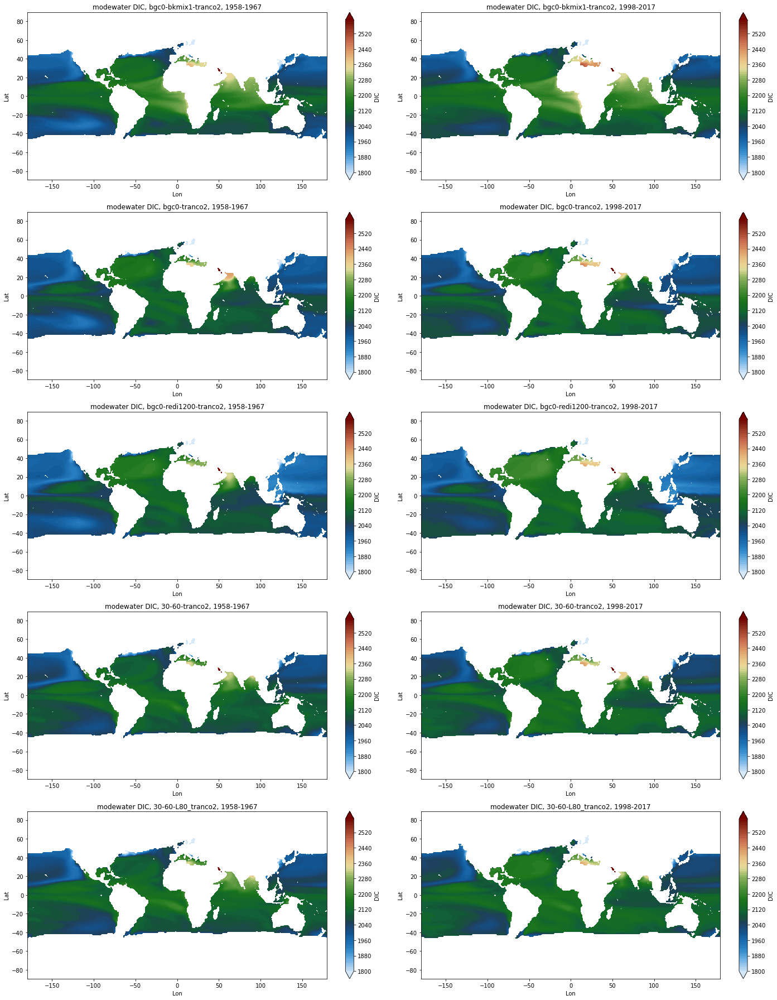

In [69]:
%%time

plt.figure(figsize=(20,25), tight_layout=True)
for j, timeslice in enumerate(timeslices):
    for i, lab in enumerate(labels[:-1]):
        plt.subplot2grid((5,2),(i,j))

        mw_DIC[lab].sel(time=timeslice).mean(dim='Z').mean(dim='time').plot.contourf(levels=np.arange(1800,2600,10), cmap='3Wbgy5')
        plt.title(r'modewater DIC, %s, %s-%s' %(lab, timeslice.start, timeslice.stop));
        plt.ylabel('Lat')
        plt.xlabel('Lon')



CPU times: user 2min 31s, sys: 2min 39s, total: 5min 11s
Wall time: 5min 21s


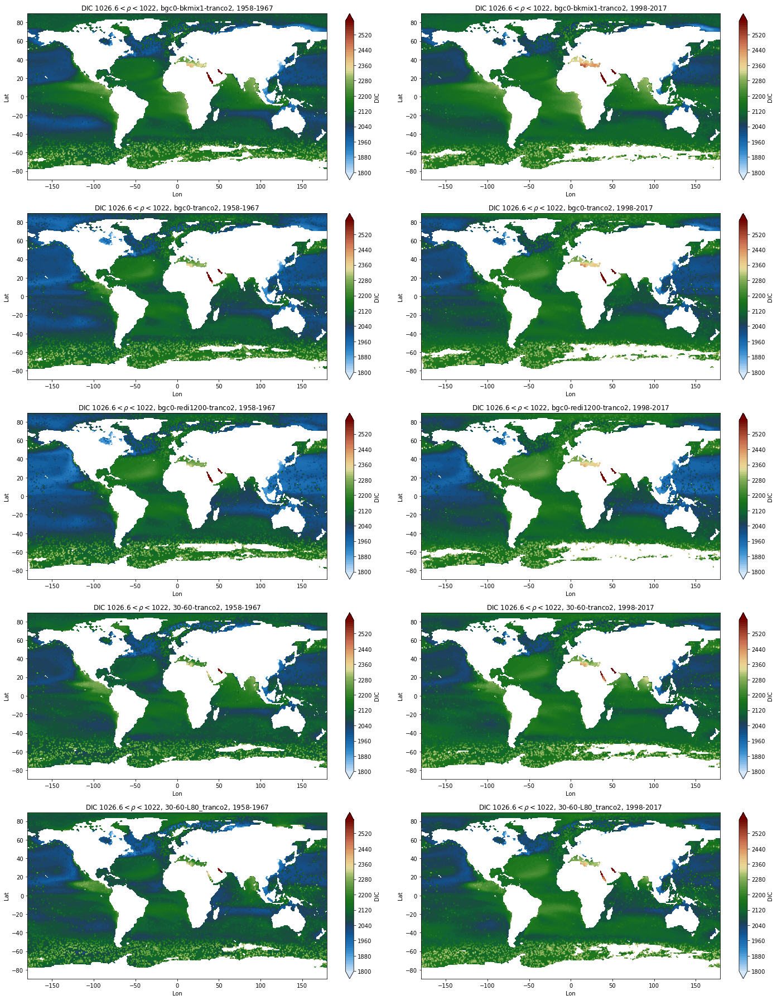

In [70]:
%%time

plt.figure(figsize=(20,25), tight_layout=True)
for j, timeslice in enumerate(timeslices):
    for i, lab in enumerate(labels[:-1]):
        plt.subplot2grid((5,2),(i,j))

        isopycnal_26_DIC[lab].sel(time=timeslice).mean(dim='Z').mean(dim='time').plot.contourf(levels=np.arange(1800,2600,10), cmap='3Wbgy5')
        plt.title(r'DIC $1026.6 < \rho < 1022$, %s, %s-%s' %(lab, timeslice.start, timeslice.stop));
        plt.ylabel('Lat')
        plt.xlabel('Lon')




CPU times: user 2min 16s, sys: 2min 32s, total: 4min 48s
Wall time: 3min 48s


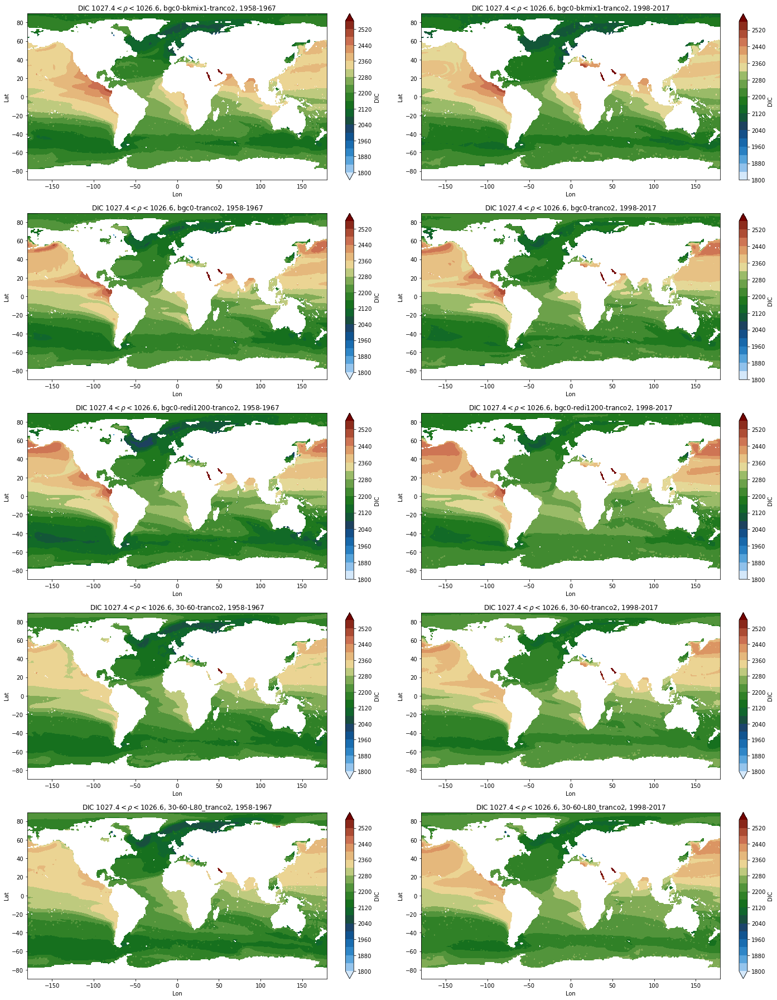

In [71]:
%%time

plt.figure(figsize=(20,25), tight_layout=True)
for j, timeslice in enumerate(timeslices):
    for i, lab in enumerate(labels[:-1]):
        plt.subplot2grid((5,2),(i,j))

        isopycnal_27_DIC[lab].sel(time=timeslice).mean(dim='Z').mean(dim='time').plot.contourf(levels=np.arange(1800,2600,40), cmap='3Wbgy5')
        plt.title(r'DIC $1027.4 < \rho < 1026.6$, %s, %s-%s' %(lab, timeslice.start, timeslice.stop));
        plt.ylabel('Lat')
        plt.xlabel('Lon')




CPU times: user 1min 34s, sys: 1min 26s, total: 3min
Wall time: 1min 42s


Text(0, 0.5, 'Z')

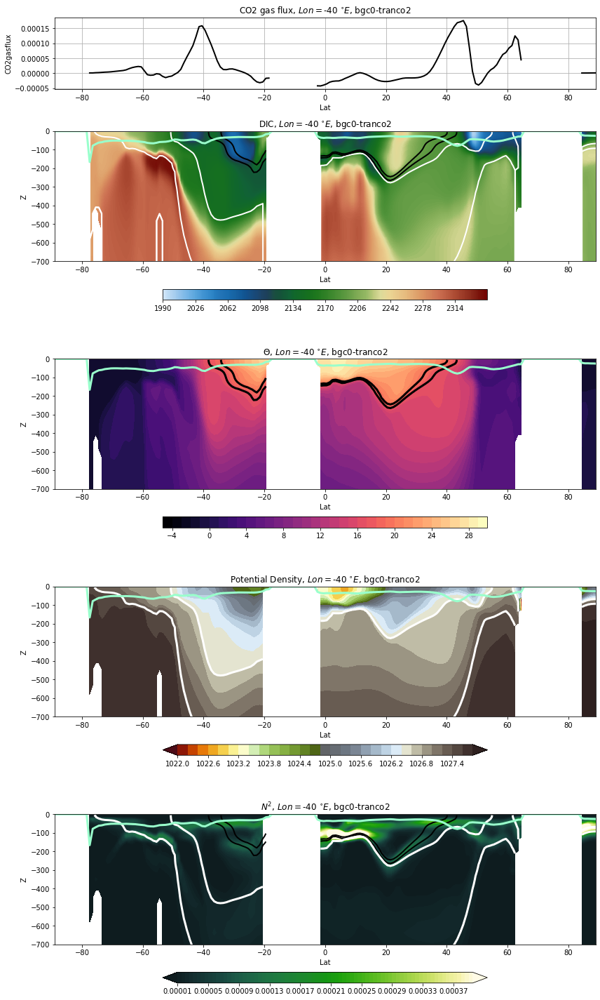

In [38]:
%%time

plt.figure(figsize=(12,20), tight_layout=True)

lt = -40
lab = labels[0]
timeslice = slice('1998','2017')

plt.subplot2grid((9,1),(0,0), rowspan=1)
ds_r[lab].where(pdmask[lab].isel(Z=0)).sel(time=timeslice).sel(lon=lt,  method='nearest').CO2gasflux.mean(dim='time').plot(label = 'mean', color = 'k', linewidth=2)
plt.title(r'CO2 gas flux, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
plt.grid()
plt.xlim([-89,89]);
plt.xlabel('Lat')

plt.subplot2grid((9,1),(1,0), rowspan=2)

ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').DIC.mean(dim='time').plot.contourf(levels=np.arange(1990, 2350, 0.2), cmap='3Wbgy5', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=2, add_labels=False)
ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
(-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

plt.xlim([-89,89]);
plt.ylim([-700,0]);
plt.title(r'DIC, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
plt.xlabel('Lat')
plt.ylabel('Z')

plt.subplot2grid((9,1),(3,0), rowspan=2)

ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contourf(levels=np.arange(-5, 31, 1), cmap='magma', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=3, add_labels=False)
(-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

plt.xlim([-89,89]);
plt.ylim([-700,0]);
plt.title(r'$\Theta$, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
plt.xlabel('Lat')
plt.ylabel('Z')


plt.subplot2grid((9,1),(5,0), rowspan=2)

ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contourf(levels=np.arange(1022, 1028, 0.2),  cmap='orange-green-blue-gray', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
(-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

plt.xlim([-89,89]);
plt.ylim([-700,0]);
plt.title(r'Potential Density, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
plt.xlabel('Lat')
plt.ylabel('Z')



plt.subplot2grid((9,1),(7,0), rowspan=2)

ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').BruntVaisalaFreqTop.mean(dim='time').plot.contourf(levels=np.arange(1e-5,4e-4, 5e-6), cmap='green-1', add_labels=False, cbar_kwargs={'orientation':'horizontal', 'shrink':0.6, 'aspect':30})
ds_r[lab].sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-1000), time=timeslice).sel(lon=lt,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)
(-ds_r[lab].sel(time=timeslice).sel(lon=lt,  method='nearest').boundaryLayerDepth).mean(dim='time').plot(color='#99ffcc', linewidth=3)

plt.xlim([-89,89]);
plt.ylim([-700,0]);
plt.title(r'$N^2$, $Lon=$%s $^{\circ}E$, %s' %(lt, lab));
plt.xlabel('Lat')
plt.ylabel('Z')



CPU times: user 45.3 s, sys: 43.4 s, total: 1min 28s
Wall time: 56.2 s


Text(0.5, 1.0, '$\\Theta$, $Lon=-40^{\\circ}$ E, years 1990-2000')

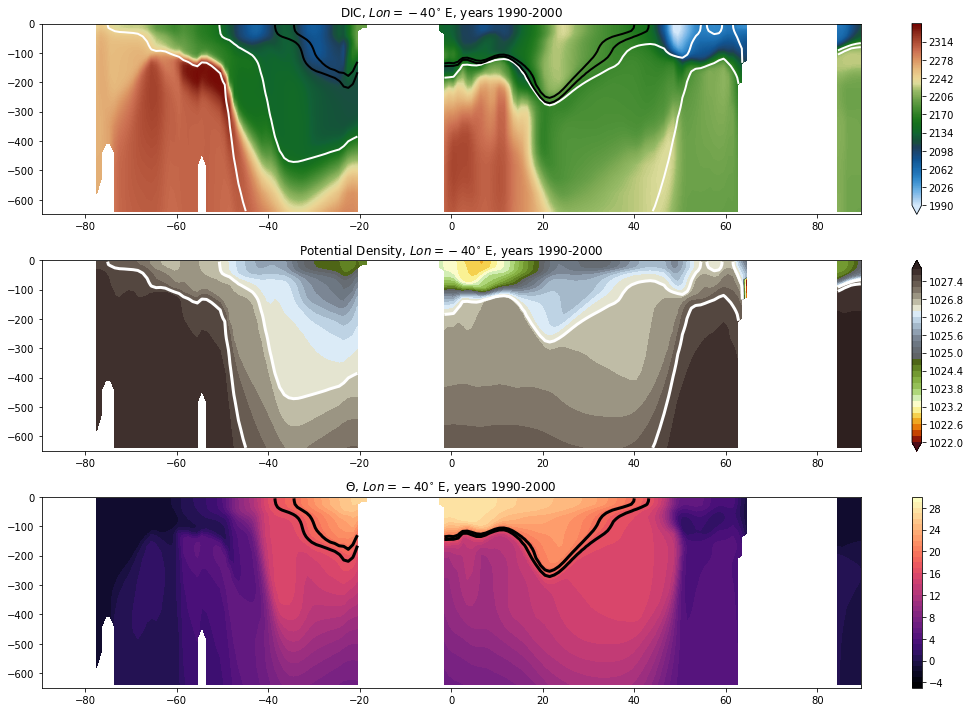

In [86]:
%%time

plt.figure(figsize=(15,10), tight_layout=True)
lab = labels[1]
plt.subplot(3,1,1)
ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').DIC.mean(dim='time').plot.contourf(levels=np.arange(1990, 2350, 0.2), cmap='3Wbgy5', add_labels=False)
ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=2, add_labels=False)
ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
plt.ylim([-650,0]);
plt.title(r'DIC, $Lon=-40^{\circ}$ E, years 1990-2000');

plt.subplot(3,1,2)
ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').potentialDensity.mean(dim='time').plot.contourf(levels=np.arange(1022, 1028, 0.2),  cmap='orange-green-blue-gray', add_labels=False)
ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)

plt.ylim([-650,0]);
plt.title(r'Potential Density, $Lon=-40^{\circ}$ E, years 1990-2000');


plt.subplot(3,1,3)
ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').temperature.mean(dim='time').plot.contourf(levels=np.arange(-5, 31, 1), cmap='magma', add_labels=False)
ds_r[lab].where(pdmask[lab]).sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=3, add_labels=False)

plt.ylim([-650,0]);
plt.title(r'$\Theta$, $Lon=-40^{\circ}$ E, years 1990-2000');

CPU times: user 21.6 s, sys: 20.4 s, total: 41.9 s
Wall time: 20.6 s


Text(0.5, 1.0, '$\\Theta$, $Lon=-40^{\\circ}$ E, years 1990-2000')

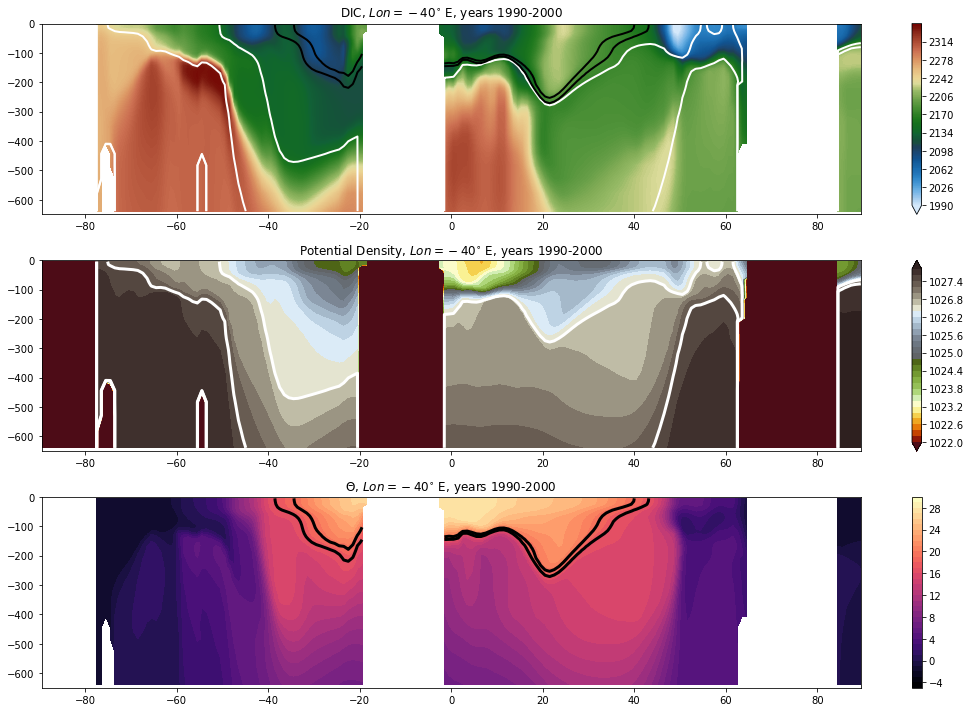

In [49]:
%%time

plt.figure(figsize=(15,10), tight_layout=True)
lab = labels[1]
plt.subplot(3,1,1)
ds_r[lab].sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').DIC.mean(dim='time').plot.contourf(levels=np.arange(1990, 2350, 0.2), cmap='3Wbgy5', add_labels=False)
ds_r[lab].sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=2, add_labels=False)
ds_r[lab].sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=2, add_labels=False)
plt.ylim([-650,0]);
plt.title(r'DIC, $Lon=-40^{\circ}$ E, years 1990-2000');

plt.subplot(3,1,2)
ds_r[lab].sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').potentialDensity.mean(dim='time').plot.contourf(levels=np.arange(1022, 1028, 0.2),  cmap='orange-green-blue-gray', add_labels=False)
ds_r[lab].sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').potentialDensity.mean(dim='time').plot.contour(levels=[1026.6, 1027.4], colors='w', linewidths=3, add_labels=False)

plt.ylim([-650,0]);
plt.title(r'Potential Density, $Lon=-40^{\circ}$ E, years 1990-2000');


plt.subplot(3,1,3)
ds_r[lab].sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').temperature.mean(dim='time').plot.contourf(levels=np.arange(-5, 31, 1), cmap='magma', add_labels=False)
ds_r[lab].sel(Z = slice(0,-700), time=slice('1990','2000')).sel(lon=-40,  method='nearest').temperature.mean(dim='time').plot.contour(levels=[17, 19], colors='k', linewidths=3, add_labels=False)

plt.ylim([-650,0]);
plt.title(r'$\Theta$, $Lon=-40^{\circ}$ E, years 1990-2000');

In [92]:
for lab in labels[:-1]:
    ds_r[lab] = ds_r[lab].isel(time=slice(0,720))

In [99]:
%%time

ds_y = {}

ds_d = {}

for lab in labels[:-1]:
    ds_y[lab] = ds_r[lab].groupby('time.year').mean(dim='time')
    ds_d[lab] = ds_r[lab].resample(time='10Y').mean(dim='time')
    

CPU times: user 1min 8s, sys: 508 ms, total: 1min 9s
Wall time: 1min 9s


In [95]:
ds_r[lab].resample(time='10Y').mean(dim='time')

<xarray.Dataset>
Dimensions:             (time: 7, lat: 180, lon: 360, nbnd: 2, Z: 80)
Coordinates:
  * time                (time) datetime64[ns] 1958-12-31 ... 2018-12-31
  * lat                 (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
  * lon                 (lon) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * Z                   (Z) float64 -0.9934 -3.07 ... -5.331e+03 -5.477e+03
Dimensions without coordinates: nbnd
Data variables:
    lat_bnds            (time, lat, nbnd) float64 dask.array<chunksize=(1, 180, 2), meta=np.ndarray>
    lon_bnds            (time, lon, nbnd) float64 dask.array<chunksize=(1, 360, 2), meta=np.ndarray>
    gw                  (time, lat) float64 dask.array<chunksize=(1, 180), meta=np.ndarray>
    area                (time, lat, lon) float64 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    potentialDensity    (time, Z, lat, lon) float32 dask.array<chunksize=(1, 80, 180, 360), meta=np.ndarray>
    temperature         (time, Z, lat, lon) float32 dask.array<chunksize=(1, 80, 180, 360), meta=np.ndarray>
    DIC                 (time, Z, lat, lon) float32 dask.array<chunksize=(1, 80, 180, 360), meta=np.ndarray>
    CO2gasflux          (time, lat, lon) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    boundaryLayerDepth  (time, lat, lon) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>

In [98]:
# ds_r[lab].groupby('time.year').mean(dim='time').groupby('year.10').mean(dim='year')